# Physical Interpretation of Convolutional Neural Nets for Predicting Thunderstorm Rotation

This notebook was used for the short course [Machine Learning in Python for Environmental Science Problems: Advanced Topics](https://annual.ametsoc.org/index.cfm/2020/programs/short-courses-workshops/short-course-machine-learning-in-python-for-environmental-science-problems-advanced-topics/) at the American Meteorological Society (AMS) 2020 annual meeting.

If you use code from this notebook, please cite it as follows.

Lagerquist, Ryan, and David John Gagne II, 2020: "Physical interpretation of convolutional neural nets for predicting thunderstorm rotation". https://github.com/alburke/ams-2020-ml-python-course/blob/master/Advanced_Topics_In_Machine_Learning/notebook.ipynb.

# References

Publications referenced in the notebook are listed below.

Breiman, L., 2001: "Random forests." *Machine Learning*, **45**, 5–32, https://doi.org/10.1023/A:1010933404324.

Hsu, W., and A. Murphy, 1986: "The attributes diagram: A geometrical framework for assessing the quality of probability forecasts." *International Journal of Forecasting*, **2**, 285–293, https://doi.org/10.1016/0169-2070(86)90048-8.

Lakshmanan, V., C. Karstens, J. Krause, K. Elmore, A. Ryzhkov, and S. Berkseth, 2015: "Which polarimetric variables are important for weather/no-weather discrimination?" *Journal of Atmospheric and Oceanic Technology*, **32**, 1209-1223, https://doi.org/10.1175/JTECH-D-13-00205.1.

Metz, C., 1978: "Basic principles of ROC analysis." *Seminars in Nuclear Medicine*, **8**, 283–298, https://doi.org/10.1016/S0001-2998(78)80014-2.

Olah, C., A. Mordvintsev, and L. Schubert, 2017: "Feature visualization." *Distill*, https://doi.org/10.23915/distill.00007.

Roebber, P., 2009: "Visualizing multiple measures of forecast quality." *Weather and Forecasting*, **24**, 601-608, https://doi.org/10.1175/2008WAF2222159.1.

Simonyan, K., A. Vedaldi, and A. Zisserman, 2014: "Deep inside convolutional networks: Visualising image classification models and saliency maps." *arXiv e-prints*, **1312**, https://arxiv.org/abs/1312.6034.

Wagstaff, K., and J. Lee: "Interpretable discovery in large image data sets." *arXiv e-prints*, **1806**, https://arxiv.org/abs/1806.08340.

# Dependencies

This notebook uses Python 3.6 with the following packages:

 - numpy
 - scipy
 - matplotlib
 - netCDF4
 - scikit-learn
 - TensorFlow
 - Keras

If you have Anaconda on a Linux or Mac, you can install these packages with the commands `pip install scipy`, `pip install tensorflow`, etc.

# <font color='red'>Imports (required)</font>

The next cell imports all modules used in the notebook.  If the code crashes anywhere, it will probably be here.

**Please note**: when a section title is in <font color='red'>red</font>, that means the code cell below is required.  In other words, if you don't run the code cell below, subsequent code cells might not work.  Required cells are at the top of the notebook.  Once you see a non-required cell, you don't have to worry about required cells anymore.

In [1]:
%matplotlib inline
import os.path
import numpy
import keras
from matplotlib import pyplot
from interpretation import utils, normalization, binarization
from interpretation import plotting
from interpretation import (
    cnn, permutation, saliency, class_activation, novelty_detection
)
from interpretation import backwards_optimization as backwards_opt

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/ryan.lagerquis

# <font color='red'>Prevent auto-scrolling (required)</font>

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

# <font color='red'>Constants (required)</font>

The next cell defines constants.  You may need to change `IMAGE_DIR_NAME` to wherever you have downloaded the input data (storm-centered model grids).  You can download and unzip the data with [this script](https://github.com/alburke/ams-2020-ml-python-course/blob/master/download_data.py), or you can download by clicking [here](https://storage.googleapis.com/track_data_ncar_ams_3km_nc_small/track_data_ncar_ams_3km_nc_small.tar.gz), then unzipping manually.

In [3]:
IMAGE_DIR_NAME = '../data/track_data_ncar_ams_3km_nc_small'

BEST_HIT_MATRIX_KEY = 'best_hits_predictor_matrix'
WORST_FALSE_ALARM_MATRIX_KEY = 'worst_false_alarms_predictor_matrix'
WORST_MISS_MATRIX_KEY = 'worst_misses_predictor_matrix'
BEST_CORRECT_NULLS_MATRIX_KEY = 'best_correct_nulls_predictor_matrix'
PREDICTOR_NAMES_KEY = 'predictor_names'

SEPARATOR_STRING = '\n\n' + '*' * 50 + '\n\n'
MINOR_SEPARATOR_STRING = '\n\n' + '-' * 50 + '\n\n'

# <font color='red'>Find and read data (required)</font>

The next cell finds training data, finds validation data, and reads validation data.  You might wonder why it's not reading the training data as well.  This is because the training set is much larger than the validation set and reading it all into memory at once might crash your machine.  If you choose to train a new model in this notebook (you will have the option later), training data will be fed to the model by a "generator".  A generator reads a small amount of training data, feeds it to the model, purges the data from memory, then reads the next batch of training data, etc.  Thus, you can have a huge training set (terabytes or petabytes) without needing huge amounts of random-access memory (RAM).

In [4]:
training_file_names = utils.find_many_image_files(
    first_date_string='20100101', last_date_string='20141224',
    image_dir_name=IMAGE_DIR_NAME
)

validation_file_names = utils.find_many_image_files(
    first_date_string='20150101', last_date_string='20151231',
    image_dir_name=IMAGE_DIR_NAME
)

validation_image_dict = utils.read_many_image_files(validation_file_names)

Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150331-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150416-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150422-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150505-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150510-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150523-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150528-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150605-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150612-0000_d01_model_patches.nc"...
Reading da

# <font color='red'>Find normalization parameters (required)</font>

The next cell finds normalization parameters.  Inside the model, all predictors variables are normalized.  There are many ways to do normalization, but I have chosen $z$-scores.  The equation for $z$-score is as follows, where $x$ is the original value; $\overline{x}$ is the mean; and $s$ is the standard deviation.

$z = \frac{x - \overline{x}}{s}$

$z$-scores follow the standard normal distribution, with mean of 0.0 and standard deviation of 1.0.

The main reason for normalization is that in physical (unnormalized) units the variables have different ranges.  For example, wind components range from about $\left[ -20, +20 \right]$ m s$^{-1}$, while reflectivity ranges from 0-75 dBZ.  This causes reflectivity to have higher variance.  Without normalization, the model would focus unduly on reflectivity for this reason.

The "normalization parameters" alluded to in the title are the mean and standard deviation in the $z$-score equation.  These parameters should be computed with training data only.  If validation or testing data are used to compute normalization parameters, you have contaminated your training data and it can no longer be considered independent from the validation or testing data.

In [5]:
normalization_dict = normalization.get_image_normalization_params(
    training_file_names
)

Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20101024-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20101122-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110201-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110308-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110326-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110404-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110414-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110420-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110425-0000_d01_model_patches.nc"...
Reading da

# <font color='red'>Sanity check for normalization (required)</font>

The next cell normalizes, then denormalizes, a small amount of data.  The denormalized values should be exactly the same as the original values.

In [6]:
image_dict = utils.read_image_file(training_file_names[0])
predictor_names = image_dict[utils.PREDICTOR_NAMES_KEY]
these_predictor_values = (
    image_dict[utils.PREDICTOR_MATRIX_KEY][0, :5, :5, 0]
)

print('\nOriginal values of "{0:s}" for first storm object:\n{1:s}'.format(
    predictor_names[0], str(these_predictor_values)
))

image_dict[utils.PREDICTOR_MATRIX_KEY], _ = normalization.normalize_images(
    predictor_matrix=image_dict[utils.PREDICTOR_MATRIX_KEY],
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

these_predictor_values = (
    image_dict[utils.PREDICTOR_MATRIX_KEY][0, :5, :5, 0]
)
print((
    '\nNormalized values of "{0:s}" for first storm object:\n{1:s}'
).format(
    predictor_names[0], str(these_predictor_values)
))

image_dict[utils.PREDICTOR_MATRIX_KEY] = normalization.denormalize_images(
    predictor_matrix=image_dict[utils.PREDICTOR_MATRIX_KEY],
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

these_predictor_values = (
    image_dict[utils.PREDICTOR_MATRIX_KEY][0, :5, :5, 0]
)
print((
    '\nDenormalized values of "{0:s}" for first storm object:\n{1:s}'
).format(
    predictor_names[0], str(these_predictor_values)
))


Original values of "reflectivity_dbz" for first storm object:
[[ 0.          6.9651885   6.99899673  3.64286256  0.        ]
 [ 1.818367    4.22854471  0.28074482  0.          0.        ]
 [ 7.24424314  4.46407127  0.          0.          0.        ]
 [16.65088844 18.46622086 17.29220772 13.19463634  2.80103612]
 [19.96715736 22.98410988 23.0850563  19.88584709 11.70358849]]

Normalized values of "reflectivity_dbz" for first storm object:
[[-1.43928327 -0.99737685 -0.99523189 -1.20816184 -1.43928327]
 [-1.32391697 -1.17100323 -1.42147142 -1.43928327 -1.43928327]
 [-0.97967223 -1.15606025 -1.43928327 -1.43928327 -1.43928327]
 [-0.38286757 -0.2676938  -0.34217907 -0.6021495  -1.26157152]
 [-0.17246687  0.0189437   0.02534824 -0.1776256  -0.69674904]]

Denormalized values of "reflectivity_dbz" for first storm object:
[[ 0.          6.9651885   6.99899673  3.64286256  0.        ]
 [ 1.818367    4.22854471  0.28074482  0.          0.        ]
 [ 7.24424314  4.46407127  0.          0.      

# <font color='red'>Vorticity threshold (required)</font>

The next cell finds a threshold for the target variable.  The target variable is maximum future vorticity inside the storm, or $\zeta_{\textrm{max}}$, and is defined at each grid cell.  Thus, $\zeta_{\textrm{max}}$ is defined on a 32-by-32 grid, just like the predictor variables.  There are many possible prediction tasks in this case:

 - Pixelwise regression: predict $\zeta_{\textrm{max}}$ at every grid cell
 - Patch regression: predict the maximum of $\zeta_{\textrm{max}}$ over all grid cells (the maximum future vorticity that will be reached anywhere inside the storm)
 - Pixelwise classification: predict if $\zeta_{\textrm{max}}$ will exceed a threshold at every grid cell
 - Patch classification: predict if the maximum of $\zeta_{\textrm{max}}$ over all grid cells will exceed a threshold

This notebook does patch classification, mainly because it's easier to evaluate (the model outputs a probability, and the correct answer is "yes" or "no").

Classification requires a threshold.  I have chosen this threshold to be the 90$^{\textrm{th}}$ percentile of spatial maxima in the training data.  The next cell finds this threshold.  In some parts of the code, I call this the "binarization threshold," because it binarizes the target variable by turning it into a yes or no.

In [7]:
binarization_threshold = binarization.get_binarization_threshold(
    image_file_names=training_file_names, percentile_level=90.
)

Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20101024-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20101122-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110201-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110308-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110326-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110404-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110414-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110420-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110425-0000_d01_model_patches.nc"...
Reading da

# <font color='red'>Sanity check for vorticity threshold (required)</font>

The next cell applies the vorticity threshold to a few storm object.  When I say a "storm object," I mean one storm cell at one time step.  One storm object is one example for machine learning.  In other words, these are the basic units of input data.

In [8]:
image_dict = utils.read_image_file(training_file_names[0])
target_matrix_s_01 = image_dict[utils.TARGET_MATRIX_KEY]
numpy.random.shuffle(target_matrix_s_01)

max_target_values_s01 = numpy.max(target_matrix_s_01, axis=(1, 2))
print((
    '\nSpatial maxima of "{0:s}" for the first few storm objects:\n{1:s}'
).format(
    image_dict[utils.TARGET_NAME_KEY], str(max_target_values_s01[:20])
))

target_values = binarization.binarize_target_images(
    target_matrix=image_dict[utils.TARGET_MATRIX_KEY],
    binarization_threshold=binarization_threshold
)

print((
    '\nBinarized target values for the first few storm objects:\n{0:s}'
).format(
    str(target_values[:20])
))


Spatial maxima of "max_future_vorticity_s01" for the first few storm objects:
[0.00293763 0.00231349 0.00121801 0.01212348 0.00207634 0.00187105
 0.00249413 0.00392755 0.00199313 0.00248626 0.00707465 0.00216909
 0.00254223 0.00144322 0.00241613 0.00177925 0.00274975 0.00176449
 0.00112036 0.00208261]

Binarized target values for the first few storm objects:
[0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]


# <font color='red'>Read pre-trained CNN (required)</font>

The next cell reads a pre-trained CNN (convolutional neural net) that comes with this notebook.  You will have the opportunity to train your own, but in the event that you (a) don't have a fast enough computer, (b) have trouble training a net that performs well, or (c) just don't want to, you can use the pre-trained one throughout this notebook.

However, if you train a new net, you will probably want to call it something other than `cnn_model_object` (maybe call it `custom_cnn_model_object`).

In [9]:
cnn_file_name = './pretrained_cnn/pretrained_cnn.h5'
cnn_model_object = cnn.read_model(cnn_file_name)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


# <font color='red'>Read pre-trained upconvnet (required)</font>

The next cell reads a pre-trained upconvnet (upconvolutional network).  You will need this for novelty detection, the last interpretation method.  You will learn about upconvnets later, but basically, they project from the feature space created by a CNN back to image space.

Please note that the pre-trained upconvnet goes with the pre-trained CNN.  If you use the same upconvnet with another CNN, they will probably not "dance" together, meaning that novelty detection will give nonsense results.  Thus, even if you train your own CNN and use it to run all the other interpretation methods, you should use the two pre-trained models for novelty detection.

In [10]:
upconvnet_file_name = './pretrained_cnn/pretrained_ucn.h5'
upconvnet_model_object = cnn.read_model(upconvnet_file_name)

# Plot predictors for random storm object

The remaining code cells are **not required**.  In other words, you can run them in any order you want.

The next cell plots predictors ($u$-wind, $v$-wind, reflectivity, and temperature) for the first storm object in the validation data.

Wind is plotted here with barbs.  If you are new to meteorology and don't know how to read wind barbs, the picture below explains.  Basically, more appendages = higher wind speed and appendages point in the direction the wind is coming from.

<img src="wind_barb_explainer.png" alt="Wind-barb-explainer" width="500" />

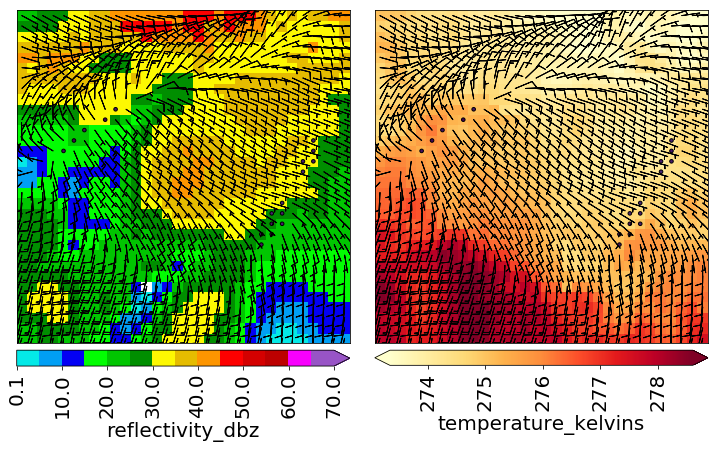

In [14]:
predictor_matrix = validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...]
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

temperature_matrix_kelvins = predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

plotting.plot_many_predictors_with_barbs(
    predictor_matrix=predictor_matrix, predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

pyplot.show()

# Plot predictors for extreme storm object

The next cell plots predictors for the storm object with strongest future rotation in the validation data (it looks like it already has strong rotation).

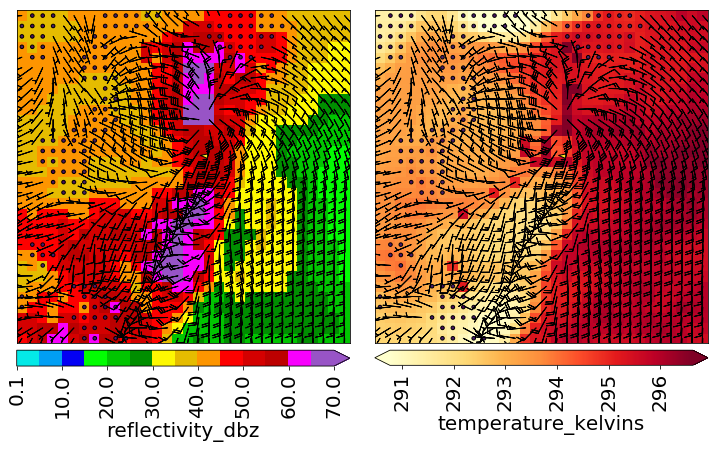

In [15]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix = validation_image_dict[utils.PREDICTOR_MATRIX_KEY][
    example_index, ...
]
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

temperature_matrix_kelvins = predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

plotting.plot_many_predictors_with_barbs(
    predictor_matrix=predictor_matrix, predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

pyplot.show()

# Plot predictors without wind barbs

The next cell plots the same data but without wind barbs.  It plots the $u$-wind and $v$-wind fields separately.

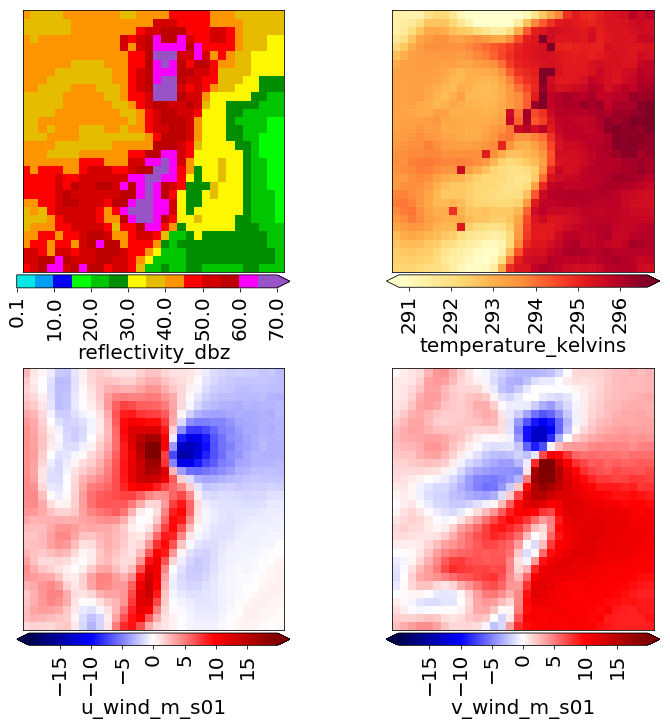

In [16]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix = validation_image_dict[utils.PREDICTOR_MATRIX_KEY][
    example_index, ...
]
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

temperature_matrix_kelvins = predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_speed_matrix_m_s01 = numpy.sqrt(
    predictor_matrix[..., predictor_names.index(utils.U_WIND_NAME)] ** 2 +
    predictor_matrix[..., predictor_names.index(utils.V_WIND_NAME)] ** 2
)
max_speed_m_s01 = numpy.percentile(
    numpy.absolute(wind_speed_matrix_m_s01), 99
)

plotting.plot_many_predictors_sans_barbs(
    predictor_matrix=predictor_matrix, predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins,
    max_colour_wind_speed_m_s01=max_speed_m_s01
)

pyplot.show()

# Setting up a CNN (optional)

At this point all code cells are optional, but this one is marked "optional" to emphasize that you really don't need to do it.  It's not part of the lesson on model interpretation.

If you're taking the course in order, you probably already know how to set up a CNN (create the architecture).  However, you might want to play with the next few code cells if (a) you're not taking the course in order, (b) you want a refresher, or (c) you just want to train your own model for fun.

The first cell below defines a method called `_get_dense_layer_dimensions`, which sets up the dense layers to have an exponentially decreasing number of neurons.  I have found that this leads to good model performance and computationally efficiency.  The dense layers often contain the majority of weights in a CNN, and if you decrease the number of neurons too slowly, you might end up with a huge number of weights, causing the training time to skyrocket (and probably causing the model to overfit as well).

The second cell below sets up a CNN.  It contains a bunch of "constants" at the top, which you can tweak as you like.  The original constants are those used in the pre-trained CNN:

 - 2 convolutional blocks
 - 2 conv layers per block
 - 32 filters in first conv layer (doubling with each successive conv layer)
 - 3-by-3 convolution filter
 - No L$_1$ regularization
 - L$_2$ regularization in conv layers with a weight of 0.001
 - 3 dense layers
 - Dropout in dense layers with a dropout rate of 0.5.  However, dropout is not used for the final dense layer (the output layer).  I have found that this causes performance to seriously degrade.
 - Activation function is leaky ReLU with slope of 0.2.

In [17]:
def _get_dense_layer_dimensions(num_input_neurons, num_classes,
                                num_dense_layers):
    """Returns dimensions (num input and output neurons) for each dense layer.

    D = number of dense layers

    :param num_input_neurons: Number of input neurons (features created by
        flattening layer).
    :param num_classes: Number of output classes (possible values of target
        variable).
    :param num_dense_layers: Number of dense layers.
    :return: num_inputs_by_layer: length-D numpy array with number of input
        neurons by dense layer.
    :return: num_outputs_by_layer: length-D numpy array with number of output
        neurons by dense layer.
    """

    if num_classes == 2:
        num_output_neurons = 1
    else:
        num_output_neurons = num_classes + 0

    e_folding_param = (
        -1.0 * num_dense_layers /
        numpy.log(float(num_output_neurons) / num_input_neurons)
    )

    dense_layer_indices = numpy.linspace(
        0, num_dense_layers - 1, num=num_dense_layers, dtype=float
    )
    num_inputs_by_layer = num_input_neurons * numpy.exp(
        -dense_layer_indices / e_folding_param
    )
    num_inputs_by_layer = numpy.round(num_inputs_by_layer).astype(int)

    num_outputs_by_layer = numpy.concatenate((
        num_inputs_by_layer[1:],
        numpy.array([num_output_neurons], dtype=int)
    ))

    return num_inputs_by_layer, num_outputs_by_layer

In [20]:
# Feel free to play with these constants!

NUM_CONV_BLOCKS = 2
NUM_LAYERS_PER_BLOCK = 2
FIRST_NUM_CONV_FILTERS = 32
NUM_CONV_FILTER_ROWS = 3
NUM_CONV_FILTER_COLUMNS = 3

L1_WEIGHT = 0.
L2_WEIGHT = 0.001
NUM_DENSE_LAYERS = 3
DENSE_LAYER_DROPOUT_FRACTION = 0.5
SLOPE_FOR_RELU = 0.2

regularizer_object = keras.regularizers.l1_l2(l1=L1_WEIGHT, l2=L2_WEIGHT)

# Find grid dimensions and number of channels.
image_dict = utils.read_image_file(training_file_names[0])
predictor_matrix = image_dict[utils.PREDICTOR_MATRIX_KEY]
num_grid_rows = predictor_matrix.shape[1]
num_grid_columns = predictor_matrix.shape[2]
num_channels = predictor_matrix.shape[3]

# Create input layer.
input_layer_object = keras.layers.Input(
    shape=(num_grid_rows, num_grid_columns, num_channels)
)

# Add convolutional and pooling layers, with activation and batch
# normalization after each conv layer.
current_num_filters = None
current_layer_object = None

for _ in range(NUM_CONV_BLOCKS):
    for _ in range(NUM_LAYERS_PER_BLOCK):
        if current_num_filters is None:
            current_num_filters = FIRST_NUM_CONV_FILTERS + 0
            current_layer_object = input_layer_object
        else:
            current_num_filters *= 2

        current_layer_object = keras.layers.Conv2D(
            filters=current_num_filters,
            kernel_size=(NUM_CONV_FILTER_ROWS, NUM_CONV_FILTER_COLUMNS),
            strides=(1, 1), padding='valid', data_format='channels_last',
            dilation_rate=(1, 1), activation=None, use_bias=True,
            kernel_initializer='glorot_uniform', bias_initializer='zeros',
            kernel_regularizer=regularizer_object
        )(current_layer_object)

        current_layer_object = keras.layers.LeakyReLU(
            alpha=SLOPE_FOR_RELU
        )(current_layer_object)

        current_layer_object = keras.layers.BatchNormalization(
            axis=-1, center=True, scale=True
        )(current_layer_object)

    current_layer_object = keras.layers.MaxPooling2D(
        pool_size=(2, 2), strides=(2, 2),
        padding='valid', data_format='channels_last'
    )(current_layer_object)

these_dimensions = numpy.array(
    current_layer_object.get_shape().as_list()[1:], dtype=int
)
num_scalar_features = numpy.prod(these_dimensions)

current_layer_object = keras.layers.Flatten()(current_layer_object)

# Add non-final dense layers.
_, num_outputs_by_dense_layer = _get_dense_layer_dimensions(
    num_input_neurons=num_scalar_features, num_classes=2,
    num_dense_layers=NUM_DENSE_LAYERS
)

for k in range(NUM_DENSE_LAYERS - 1):
    current_layer_object = keras.layers.Dense(
        num_outputs_by_dense_layer[k], activation=None, use_bias=True,
        kernel_initializer='glorot_uniform', bias_initializer='zeros'
    )(current_layer_object)

    current_layer_object = keras.layers.LeakyReLU(
        alpha=SLOPE_FOR_RELU
    )(current_layer_object)

    current_layer_object = keras.layers.Dropout(
        rate=DENSE_LAYER_DROPOUT_FRACTION
    )(current_layer_object)

    current_layer_object = keras.layers.BatchNormalization(
        axis=-1, center=True, scale=True
    )(current_layer_object)

# Add final dense layer (output layer).
current_layer_object = keras.layers.Dense(
    1, activation=None, use_bias=True,
    kernel_initializer='glorot_uniform', bias_initializer='zeros',
)(current_layer_object)

current_layer_object = keras.layers.Activation(
    'sigmoid'
)(current_layer_object)

if NUM_DENSE_LAYERS == 1:
    current_layer_object = keras.layers.Dropout(
        rate=DENSE_LAYER_DROPOUT_FRACTION
    )(current_layer_object)

# Compile model.
custom_cnn_model_object = keras.models.Model(
    inputs=input_layer_object, outputs=current_layer_object
)
custom_cnn_model_object.compile(
    loss=keras.losses.binary_crossentropy,
    optimizer=keras.optimizers.Adam(),
    metrics=cnn.LIST_OF_METRIC_FUNCTIONS
)
custom_cnn_model_object.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 32, 32, 4)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 30, 30, 32)        1184      
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 30, 30, 32)        0         
_________________________________________________________________
batch_normalization_7 (Batch (None, 30, 30, 32)        128       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 28, 28, 64)        18496     
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 28, 28, 64)        0         
_________________________________________________________________
batch_normalization_8 (Batch (None, 28, 28, 64)        256       
__________

# Training a CNN (optional)

Again, this part of the notebook is highly optional.

The first cell below defines a method called `train_cnn`, which (not surprisingly) trains a CNN.  The first input is `model_object`, which should be an untrained CNN like the one created above.  The CNN is trained with a generator, which reads small batches of data "on the fly".  The alternative is reading all the training data into memory at once, which is infeasible for large datasets.  (For this dataset it would be fine on most desktop computers, but generators are a good thing to know about.)

The second cell below actually trains the CNN.  If you are confident in your computing power, you can uncomment the first chunk of code, which trains a CNN for 100 epochs with 32 training batches per epoch, 16 validation batches per epoch, and 1024 examples per batch.

If you have a less capable computer (or just want to train a model quickly), you can leave the second chunk uncommented.  This trains a CNN for 10 epochs with 10 training batches per epoch, 10 validation batches per epoch, and 256 examples per batch.

In this case, validation data are used to "monitor" the CNN after each epoch.  Note the three "callback objects" in `train_cnn`.  `checkpoint_object` saves the new model weights only if validation loss has decreased from previous epochs; `plateau_object` decreases the learning rate if a new minimum validation loss has not been reached in a while; and `early_stopping_object` stops training altogether if it has been a *really* long time since the minimum validation loss.  All these measures prevent overfitting, which is a big problem generally in machine learning, but especially in meteorology, where we often have messy data.

In [19]:
def train_cnn(
        model_object, training_file_names, validation_file_names,
        num_examples_per_batch, normalization_dict, binarization_threshold,
        num_epochs, num_training_batches_per_epoch,
        num_validation_batches_per_epoch, output_file_name):
    """Trains CNN.

    :param model_object: Untrained model (instance of `keras.models.Model` or
        `keras.models.Sequential`).
    :param training_file_names: 1-D list of paths to training files (readable by
        `utils.read_image_file`).
    :param validation_file_names: Same but for validation files.
    :param num_examples_per_batch: See doc for `data_generator`.
    :param normalization_dict: Same.
    :param binarization_threshold: Same.
    :param num_epochs: Number of epochs.
    :param num_training_batches_per_epoch: Number of training batches per epoch.
    :param num_validation_batches_per_epoch: Number of validation batches per
        epoch.
    :param output_file_name: Path to output file.  The trained model will be
        saved here, after each epoch, as an HDF5 file.
    :return: cnn_metadata_dict: See doc for `write_metadata`.
    """

    utils.create_directory(file_name=output_file_name)

    cnn_metadata_dict = {
        cnn.TRAINING_FILES_KEY: training_file_names,
        cnn.NORMALIZATION_DICT_KEY: normalization_dict,
        cnn.BINARIZATION_THRESHOLD_KEY: binarization_threshold,
        cnn.NUM_EXAMPLES_PER_BATCH_KEY: num_examples_per_batch,
        cnn.NUM_TRAINING_BATCHES_KEY: num_training_batches_per_epoch,
        cnn.VALIDATION_FILES_KEY: validation_file_names,
        cnn.NUM_VALIDATION_BATCHES_KEY: num_validation_batches_per_epoch
    }

    checkpoint_object = keras.callbacks.ModelCheckpoint(
        filepath=output_file_name, monitor='val_loss',
        save_best_only=True, save_weights_only=False, mode='min', period=1,
        verbose=1
    )
    early_stopping_object = keras.callbacks.EarlyStopping(
        monitor='val_loss', min_delta=cnn.CROSS_ENTROPY_PATIENCE,
        patience=cnn.EARLY_STOPPING_PATIENCE_EPOCHS, mode='min', verbose=1
    )
    plateau_object = keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=cnn.PLATEAU_LEARNING_RATE_MULTIPLIER,
        patience=cnn.PLATEAU_PATIENCE_EPOCHS, mode='min',
        min_delta=cnn.CROSS_ENTROPY_PATIENCE,
        cooldown=cnn.PLATEAU_COOLDOWN_EPOCHS,
        verbose=1
    )

    list_of_callback_objects = [
        checkpoint_object, early_stopping_object, plateau_object
    ]

    training_generator = cnn.data_generator(
        image_file_names=training_file_names,
        num_examples_per_batch=num_examples_per_batch,
        normalization_dict=normalization_dict,
        binarization_threshold=binarization_threshold
    )

    validation_generator = cnn.data_generator(
        image_file_names=validation_file_names,
        num_examples_per_batch=num_examples_per_batch,
        normalization_dict=normalization_dict,
        binarization_threshold=binarization_threshold
    )

    model_object.fit_generator(
        generator=training_generator,
        steps_per_epoch=num_training_batches_per_epoch, epochs=num_epochs,
        verbose=1, callbacks=list_of_callback_objects, workers=0,
        validation_data=validation_generator,
        validation_steps=num_validation_batches_per_epoch
    )

    return cnn_metadata_dict

# Training the CNN: Example

The next cell actually trains the CNN.

In [ ]:
output_file_name = '{0:s}/custom_cnn/model.h5'.format(IMAGE_DIR_NAME)

# train_cnn(
#     model_object=cnn_model_object,
#     training_file_names=training_file_names,
#     validation_file_names=validation_file_names,
#     normalization_dict=normalization_dict,
#     binarization_threshold=binarization_threshold,
#     num_training_batches_per_epoch=32,
#     num_validation_batches_per_epoch=16,
#     num_examples_per_batch=1024, num_epochs=100,
#     output_file_name=output_file_name
# )

train_cnn(
    model_object=custom_cnn_model_object,
    training_file_names=training_file_names,
    validation_file_names=validation_file_names,
    normalization_dict=normalization_dict,
    binarization_threshold=binarization_threshold,
    num_training_batches_per_epoch=10,
    num_validation_batches_per_epoch=10,
    num_examples_per_batch=256, num_epochs=10,
    output_file_name=output_file_name
)

Epoch 1/10
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20130527-0000_d01_model_patches.nc"...
Fraction of examples in positive class: 0.1094
 1/10 [==>...........................] - ETA: 29s - loss: 1.1848 - accuracy: 0.0521 - binary_accuracy: 0.5032 - binary_csi: 0.0949 - binary_frequency_bias: 4.4941 - binary_pod: 0.4762 - binary_pofd: 0.4934 - binary_peirce_score: -0.0173 - binary_success_ratio: 0.1060 - binary_focn: 0.8873Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110610-0000_d01_model_patches.nc"...
Fraction of examples in positive class: 0.0703
 2/10 [=====>........................] - ETA: 17s - loss: 1.2805 - accuracy: 0.0475 - binary_accuracy: 0.5171 - binary_csi: 0.0894 - binary_frequency_bias: 5.6922 - binary_pod: 0.5432 - binary_pofd: 0.4842 - binary_peirce_score: 0.0590 - binary_success_ratio: 0.0973 - binary_focn: 0.9171 Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20140628-0000_d01_model_pa

# Permutation Test

The next cell defines methods that run the permutation test on a trained CNN.  The permutation test is used to gauge the importance of each predictor variable.  There are two versions of the permutation test: single-pass (Breiman 2001) and multi-pass (Lakshmanan *et al.* 2015).

## Breiman Version (figure credit to Amy McGovern)

<img src="breiman_permutation.gif" alt="Breiman permutation" width="500" />

At a given time, only one predictor is permuted (randomized).  The amount by which the cost function increases when $x$ is permuted, is used to gauge the importance of $x$.  If the cost function remains the same or decreases when $x$ is permuted, $x$ is a useless predictor.  If the cost function increases slightly when $x$ is permuted, $x$ is a somewhat important predictor.  If the cost function skyrockets when $x$ is permuted, $x$ is a very important predictor.

## Lakshmanan Version (figure credit to Amy McGovern)

<img src="lak_permutation.gif" alt="Lakshmanan permutation" width="500" />

At a given time, one or more predictors may be permuted (randomized).  The $1^{\textrm{st}}$ predictor permuted is the one that increases the cost function ($\epsilon$) the most with 0 other predictors permuted; the $2^{\textrm{nd}}$ predictor permuted is that which increases $\epsilon$ the most with the $1^{\textrm{st}}$ predictor already permuted; $\ldots$; and the $k^{\textrm{th}}$ predictor permuted is that which increases $\epsilon$ the most with the $1^{\textrm{st}}\ldots(k - 1)^{\textrm{th}}$ predictors already permuted.

# Forward Permutation Test

In [13]:
target_values = binarization.binarize_target_images(
    target_matrix=validation_image_dict[utils.TARGET_MATRIX_KEY],
    binarization_threshold=binarization_threshold
)
clean_predictor_matrix = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY] + 0.
)
clean_predictor_matrix, _ = normalization.normalize_images(
    predictor_matrix=clean_predictor_matrix,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY],
    normalization_dict=normalization_dict
)

# permutation_result_dict = permutation.run_forward_test(
#     model_object=cnn_model_object,
#     clean_predictor_matrix=clean_predictor_matrix,
#     target_values=target_values,
#     predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
# )

permutation_result_dict = permutation.run_forward_test(
    model_object=cnn_model_object,
    clean_predictor_matrix=clean_predictor_matrix[:2000, ...],
    target_values=target_values[:2000],
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/ams_2020_ml_python_course-0.1-py3.6.egg/interpretation/permutation.py:414: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  assert numpy.issubdtype(target_values.dtype, int)


Average cost = -0.8789


**************************************************


Permuting predictor "reflectivity_dbz" at step 1...
Average cost = -0.6904
Permuting predictor "temperature_kelvins" at step 1...
Average cost = -0.8433
Permuting predictor "u_wind_m_s01" at step 1...
Average cost = -0.8457
Permuting predictor "v_wind_m_s01" at step 1...
Average cost = -0.8425
Best predictor = "reflectivity_dbz" ... cost = -0.6904


**************************************************


Permuting predictor "temperature_kelvins" at step 2...
Average cost = -0.6398
Permuting predictor "u_wind_m_s01" at step 2...
Average cost = -0.6056
Permuting predictor "v_wind_m_s01" at step 2...
Average cost = -0.6170
Best predictor = "u_wind_m_s01" ... cost = -0.6056


**************************************************


Permuting predictor "temperature_kelvins" at step 3...
Average cost = -0.5500
Permuting predictor "v_wind_m_s01" at step 3...
Average cost = -0.5582
Best predictor = "temperature_kelvins" ...

# Forward Permutation test

Text(0.5,1,'Multi-pass forward test')

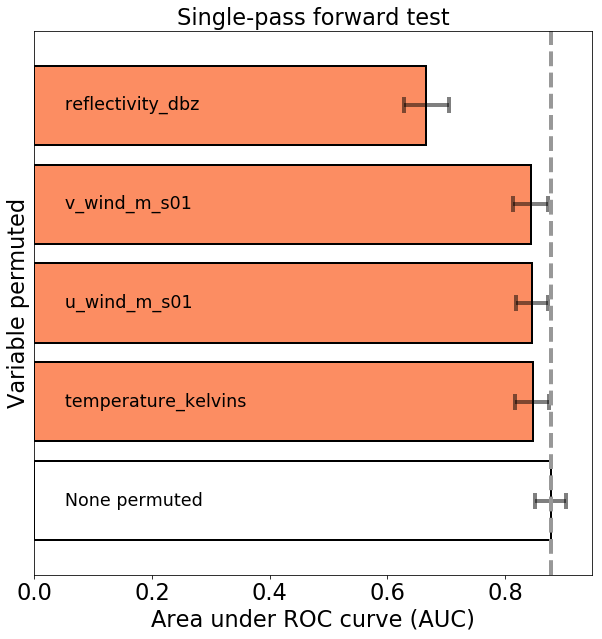

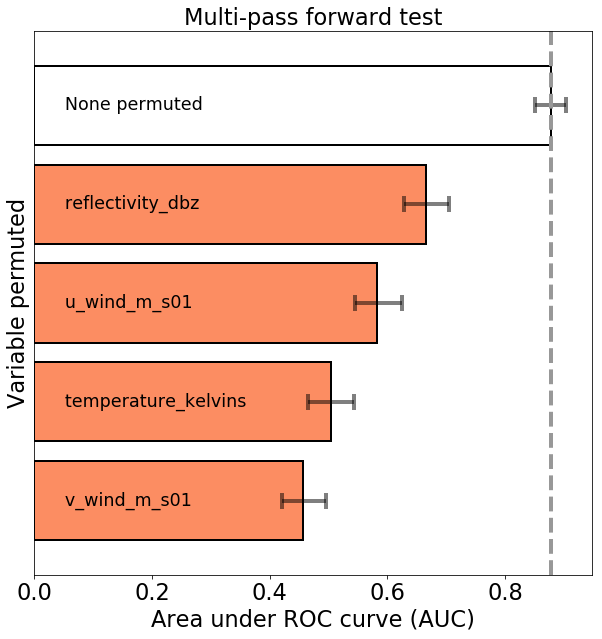

In [15]:
axes_object = permutation.plot_single_pass_test(
    result_dict=permutation_result_dict
)
axes_object.set_title('Single-pass forward test')

axes_object = permutation.plot_multipass_test(
    result_dict=permutation_result_dict
)
axes_object.set_title('Multi-pass forward test')

# Backwards Permutation Test

In [16]:
target_values = binarization.binarize_target_images(
    target_matrix=validation_image_dict[utils.TARGET_MATRIX_KEY],
    binarization_threshold=binarization_threshold
)
clean_predictor_matrix = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY] + 0.
)
clean_predictor_matrix, _ = normalization.normalize_images(
    predictor_matrix=clean_predictor_matrix,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY],
    normalization_dict=normalization_dict
)

# permutation_result_dict = permutation.run_backwards_test(
#     model_object=cnn_model_object,
#     clean_predictor_matrix=clean_predictor_matrix,
#     target_values=target_values,
#     predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
# )

permutation_result_dict = permutation.run_backwards_test(
    model_object=cnn_model_object,
    clean_predictor_matrix=clean_predictor_matrix[:2000, ...],
    target_values=target_values[:2000],
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/ams_2020_ml_python_course-0.1-py3.6.egg/interpretation/permutation.py:414: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  assert numpy.issubdtype(target_values.dtype, int)


Average cost = -0.5445


**************************************************


Unpermuting predictor "reflectivity_dbz" at step 1...
Average cost = -0.7773
Unpermuting predictor "temperature_kelvins" at step 1...
Average cost = -0.5951
Unpermuting predictor "u_wind_m_s01" at step 1...
Average cost = -0.5840
Unpermuting predictor "v_wind_m_s01" at step 1...
Average cost = -0.5845
Best predictor = "reflectivity_dbz" ... cost = -0.7773


**************************************************


Unpermuting predictor "temperature_kelvins" at step 2...
Average cost = -0.8128
Unpermuting predictor "u_wind_m_s01" at step 2...
Average cost = -0.8076
Unpermuting predictor "v_wind_m_s01" at step 2...
Average cost = -0.8069
Best predictor = "temperature_kelvins" ... cost = -0.8128


**************************************************


Unpermuting predictor "u_wind_m_s01" at step 3...
Average cost = -0.8423
Unpermuting predictor "v_wind_m_s01" at step 3...
Average cost = -0.8441
Best predictor = "v_wind

# Backwards Permutation Test

Text(0.5,1,'Multi-pass backwards test')

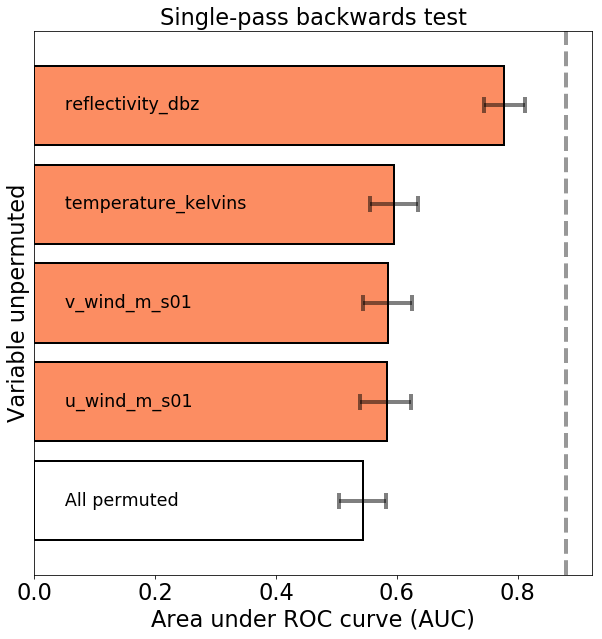

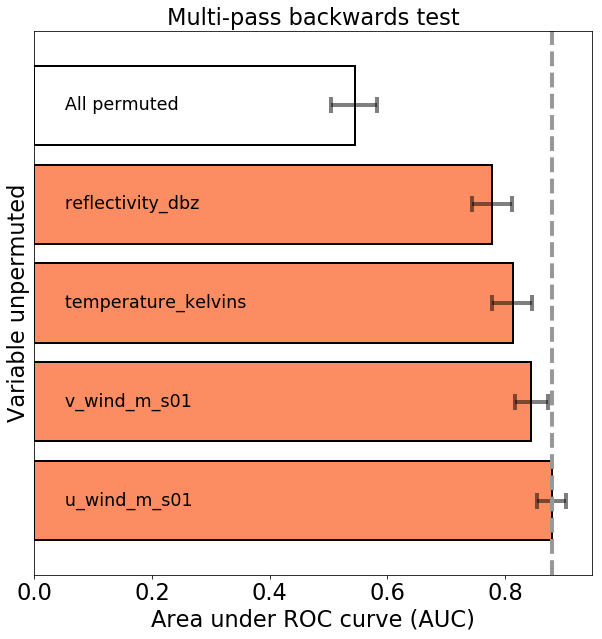

In [17]:
axes_object = permutation.plot_single_pass_test(
    result_dict=permutation_result_dict
)
axes_object.set_title('Single-pass backwards test')

axes_object = permutation.plot_multipass_test(
    result_dict=permutation_result_dict
)
axes_object.set_title('Multi-pass backwards test')

# Saliency Maps

The next cell defines methods that compute saliency maps (Simonyan *et al.* 2014).  Saliency is defined as follows, where $a$ is the activation of some model component; $x$ is an input variable (one predictor at one grid cell); and $x_0$ is the value of $x$ in a real dataset example.

$\textrm{saliency} = \frac{\partial a}{\partial x} \rvert_{x = x_0}$

In other words, saliency is a linear approximation to the derivative $\frac{\partial a}{\partial x}$ around the point $x = x_0$.  Saliency is computed for each predictor $x$ at each grid cell $(i, j)$, so the saliency map for example $E$ has the same dimensions as example $E$.  This makes saliency maps easy to plot.

As for backwards optimization, "some model component" could be any of the following (figure from https://distill.pub/2018/building-blocks/).

 - Neuron activation: spatial position $(i, j)$ in channel $k$ of layer $L$
 - Channel activation: all spatial positions in channel $k$ of layer $L$
 - Layer activation: all spatial positions in all channels of layer $L$
 - Spatial activation: spatial position $(i, j)$ in all channels of layer $L$
 - Final prediction: probability that max future storm vorticity $\ge$ threshold

<img src="model_components.png" alt="Model components" width="1000" />

# Saliency: Example 1

The next cell computes the saliency map for the first validation example with respect to the **positive** class (max future storm vorticity $\ge \zeta^*$).

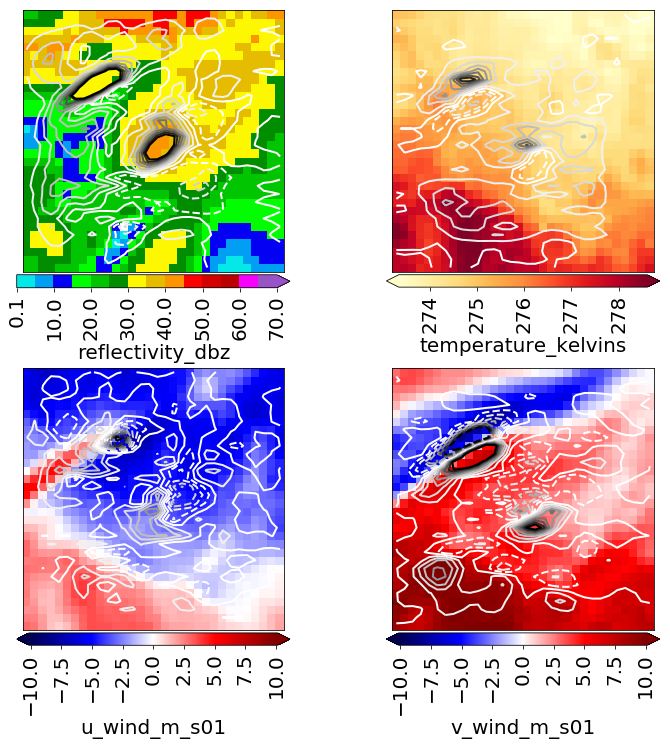

In [22]:
predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
predictor_matrix_norm = numpy.expand_dims(predictor_matrix_norm, axis=0)

saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=[predictor_matrix_norm]
)[0][0, ...]

saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[saliency_matrix], smoothing_radius_grid_cells=1
)[0]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

max_contour_value = numpy.percentile(numpy.absolute(saliency_matrix), 99)

saliency.plot_saliency_maps(
    saliency_matrix_3d=saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 8
)

# Saliency: Example 2

The next cell computes the saliency map for the first validation example with respect to the **negative** class (max future storm vorticity $< \zeta^*$).

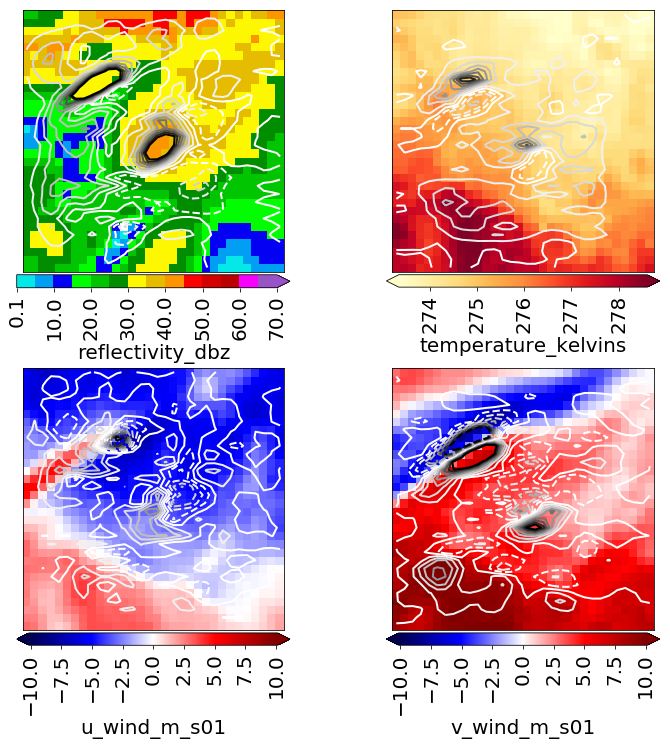

In [15]:
predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
predictor_matrix_norm = numpy.expand_dims(predictor_matrix_norm, axis=0)

saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=[predictor_matrix_norm]
)[0][0, ...]

saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[saliency_matrix], smoothing_radius_grid_cells=1
)[0]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

max_contour_value = numpy.percentile(numpy.absolute(saliency_matrix), 99)

saliency.plot_saliency_maps(
    saliency_matrix_3d=saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 8
)

# Saliency: Example 3

The next cell computes the saliency map for the most extreme validation example (greatest future vorticity) with respect to the **positive** class (max future storm vorticity $\ge \zeta^*$).

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1173: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


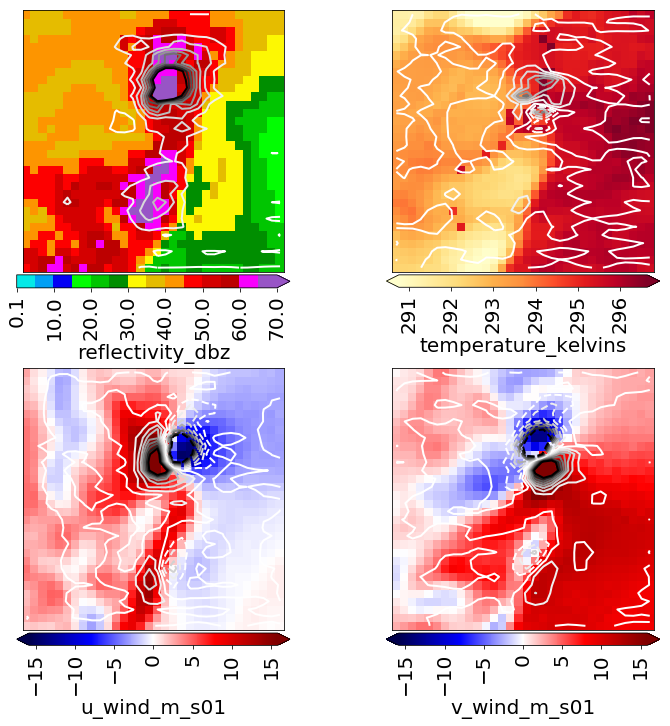

In [16]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
predictor_matrix_norm = numpy.expand_dims(predictor_matrix_norm, axis=0)

saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=[predictor_matrix_norm]
)[0][0, ...]

saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[saliency_matrix], smoothing_radius_grid_cells=1
)[0]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

max_contour_value = numpy.percentile(numpy.absolute(saliency_matrix), 99)

saliency.plot_saliency_maps(
    saliency_matrix_3d=saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 8
)

# Saliency: Example 4

The next cell computes the saliency map for the most extreme validation example (greatest future vorticity) with respect to the **negative** class (max future storm vorticity $< \zeta^*$).

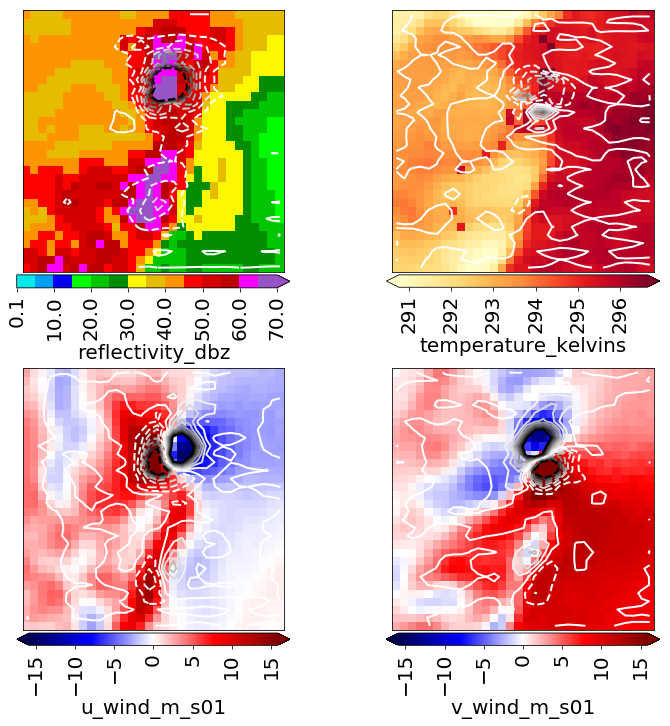

In [17]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
predictor_matrix_norm = numpy.expand_dims(predictor_matrix_norm, axis=0)

saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=0,
    list_of_input_matrices=[predictor_matrix_norm]
)[0][0, ...]

saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[saliency_matrix], smoothing_radius_grid_cells=1
)[0]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

max_contour_value = numpy.percentile(numpy.absolute(saliency_matrix), 99)

saliency.plot_saliency_maps(
    saliency_matrix_3d=saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 8
)

# Find Extreme Cases

In [15]:
predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

validation_event_probs = cnn.apply_cnn(
    model_object=cnn_model_object, predictor_matrix=predictor_matrix_norm,
    verbose=True
)
print('\n')

target_values = binarization.binarize_target_images(
    target_matrix=validation_image_dict[utils.TARGET_MATRIX_KEY],
    binarization_threshold=binarization_threshold
)

this_dict = utils.find_extreme_examples(
    class_labels=target_values, event_probabilities=validation_event_probs,
    num_examples_per_set=100
)
best_hit_indices = this_dict[utils.HIT_INDICES_KEY]
worst_false_alarm_indices = this_dict[utils.FALSE_ALARM_INDICES_KEY]
worst_miss_indices = this_dict[utils.MISS_INDICES_KEY]
best_correct_null_indices = this_dict[utils.CORRECT_NULL_INDICES_KEY]

extreme_example_dict_denorm = {
    BEST_HIT_MATRIX_KEY: predictor_matrix_denorm[best_hit_indices, ...],
    WORST_FALSE_ALARM_MATRIX_KEY:
        predictor_matrix_denorm[worst_false_alarm_indices, ...],
    WORST_MISS_MATRIX_KEY:
        predictor_matrix_denorm[worst_miss_indices, ...],
    BEST_CORRECT_NULLS_MATRIX_KEY:
        predictor_matrix_denorm[best_correct_null_indices, ...],
    PREDICTOR_NAMES_KEY: predictor_names
}

extreme_example_dict_norm = {
    BEST_HIT_MATRIX_KEY: predictor_matrix_norm[best_hit_indices, ...],
    WORST_FALSE_ALARM_MATRIX_KEY:
        predictor_matrix_norm[worst_false_alarm_indices, ...],
    WORST_MISS_MATRIX_KEY:
        predictor_matrix_norm[worst_miss_indices, ...],
    BEST_CORRECT_NULLS_MATRIX_KEY:
        predictor_matrix_norm[best_correct_null_indices, ...],
    PREDICTOR_NAMES_KEY: predictor_names
}

this_bh_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[BEST_HIT_MATRIX_KEY]
)
this_wfa_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[WORST_FALSE_ALARM_MATRIX_KEY]
)
this_wm_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[WORST_MISS_MATRIX_KEY]
)
this_bcn_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[BEST_CORRECT_NULLS_MATRIX_KEY]
)

extreme_example_dict_denorm_pmm = {
    BEST_HIT_MATRIX_KEY: this_bh_matrix,
    WORST_FALSE_ALARM_MATRIX_KEY: this_wfa_matrix,
    WORST_MISS_MATRIX_KEY: this_wm_matrix,
    BEST_CORRECT_NULLS_MATRIX_KEY: this_bcn_matrix,
    PREDICTOR_NAMES_KEY: predictor_names
}

Applying model to examples 0-999 of 25392...
Applying model to examples 1000-1999 of 25392...
Applying model to examples 2000-2999 of 25392...
Applying model to examples 3000-3999 of 25392...
Applying model to examples 4000-4999 of 25392...
Applying model to examples 5000-5999 of 25392...
Applying model to examples 6000-6999 of 25392...
Applying model to examples 7000-7999 of 25392...
Applying model to examples 8000-8999 of 25392...
Applying model to examples 9000-9999 of 25392...
Applying model to examples 10000-10999 of 25392...
Applying model to examples 11000-11999 of 25392...
Applying model to examples 12000-12999 of 25392...
Applying model to examples 13000-13999 of 25392...
Applying model to examples 14000-14999 of 25392...
Applying model to examples 15000-15999 of 25392...
Applying model to examples 16000-16999 of 25392...
Applying model to examples 17000-17999 of 25392...
Applying model to examples 18000-18999 of 25392...
Applying model to examples 19000-19999 of 25392...
Appl

# Saliency: Example 5

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1173: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


Text(0.5,0.98,'Saliency for best correct nulls')

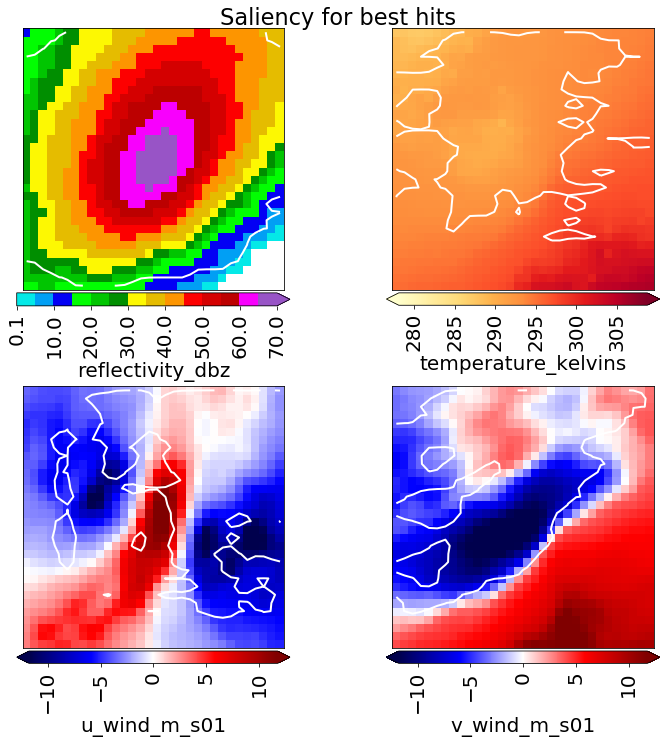

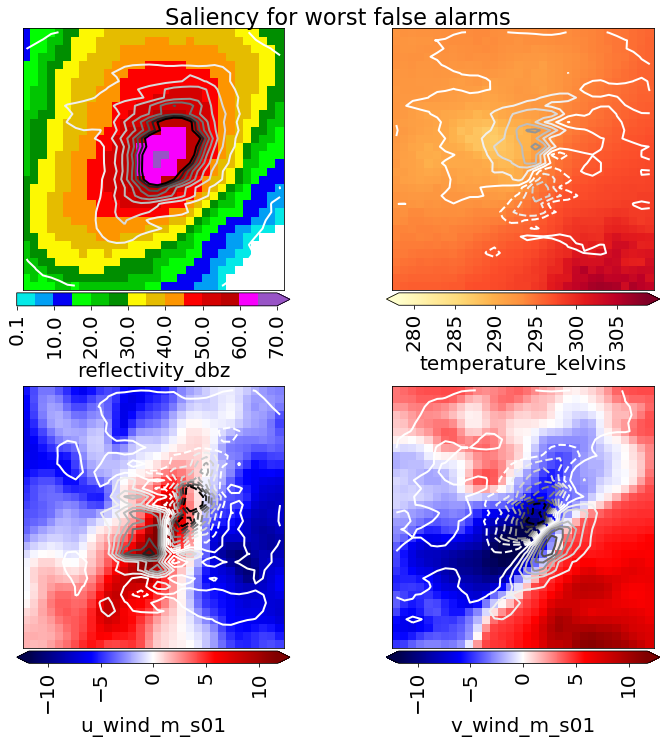

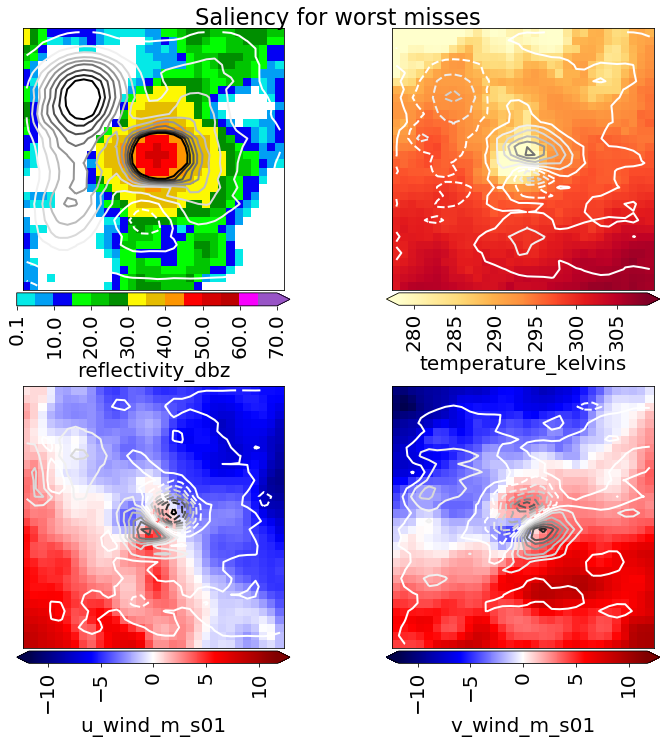

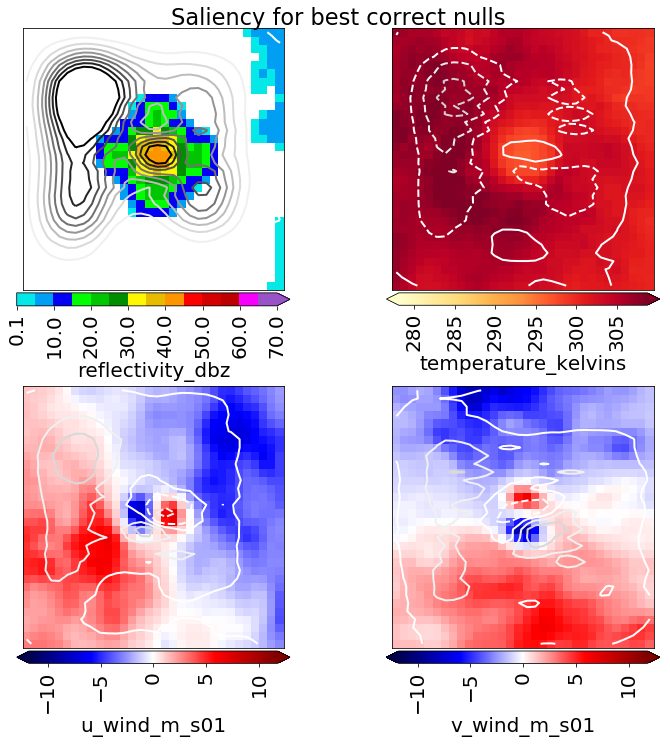

In [16]:
best_hits_saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=[extreme_example_dict_norm[BEST_HIT_MATRIX_KEY]]
)[0]
best_hits_saliency_matrix_pmm = utils.run_pmm_many_variables(
    field_matrix=best_hits_saliency_matrix
)
best_hits_saliency_matrix_pmm = saliency.smooth_saliency_maps(
    saliency_matrices=[best_hits_saliency_matrix_pmm],
    smoothing_radius_grid_cells=1
)[0]

worst_fa_saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=
    [extreme_example_dict_norm[WORST_FALSE_ALARM_MATRIX_KEY]]
)[0]
worst_fa_saliency_matrix_pmm = utils.run_pmm_many_variables(
    field_matrix=worst_fa_saliency_matrix
)
worst_fa_saliency_matrix_pmm = saliency.smooth_saliency_maps(
    saliency_matrices=[worst_fa_saliency_matrix_pmm],
    smoothing_radius_grid_cells=1
)[0]

worst_misses_saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=
    [extreme_example_dict_norm[WORST_MISS_MATRIX_KEY]]
)[0]
worst_misses_saliency_matrix_pmm = utils.run_pmm_many_variables(
    field_matrix=worst_misses_saliency_matrix
)
worst_misses_saliency_matrix_pmm = saliency.smooth_saliency_maps(
    saliency_matrices=[worst_misses_saliency_matrix_pmm],
    smoothing_radius_grid_cells=1
)[0]

best_nulls_saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=
    [extreme_example_dict_norm[BEST_CORRECT_NULLS_MATRIX_KEY]]
)[0]
best_nulls_saliency_matrix_pmm = utils.run_pmm_many_variables(
    field_matrix=best_nulls_saliency_matrix
)
best_nulls_saliency_matrix_pmm = saliency.smooth_saliency_maps(
    saliency_matrices=[best_nulls_saliency_matrix_pmm],
    smoothing_radius_grid_cells=1
)[0]

best_hits_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    BEST_HIT_MATRIX_KEY
]
worst_fa_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    WORST_FALSE_ALARM_MATRIX_KEY
]
worst_misses_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    WORST_MISS_MATRIX_KEY
]
best_nulls_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    BEST_CORRECT_NULLS_MATRIX_KEY
]
predictor_names = extreme_example_dict_denorm_pmm[PREDICTOR_NAMES_KEY]

concat_predictor_matrix = numpy.stack((
    best_hits_matrix_denorm_pmm, worst_fa_matrix_denorm_pmm,
    worst_misses_matrix_denorm_pmm, best_nulls_matrix_denorm_pmm,
), axis=0)

temperature_matrix_kelvins = concat_predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(concat_predictor_matrix[..., wind_indices]), 99
)

concat_saliency_matrix = numpy.stack((
    best_hits_saliency_matrix_pmm, worst_fa_saliency_matrix_pmm,
    worst_misses_saliency_matrix_pmm, best_nulls_saliency_matrix_pmm,
), axis=0)

max_saliency = numpy.percentile(numpy.absolute(concat_saliency_matrix), 99)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=best_hits_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=best_hits_saliency_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_saliency,
    contour_interval=max_saliency / 8
)

figure_object.suptitle('Saliency for best hits')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=worst_fa_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=worst_fa_saliency_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_saliency,
    contour_interval=max_saliency / 8
)

figure_object.suptitle('Saliency for worst false alarms')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=worst_misses_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=worst_misses_saliency_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_saliency,
    contour_interval=max_saliency / 8
)

figure_object.suptitle('Saliency for worst misses')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=best_nulls_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=best_nulls_saliency_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_saliency,
    contour_interval=max_saliency / 8
)

figure_object.suptitle('Saliency for best correct nulls')

# Class Activation: Example 1

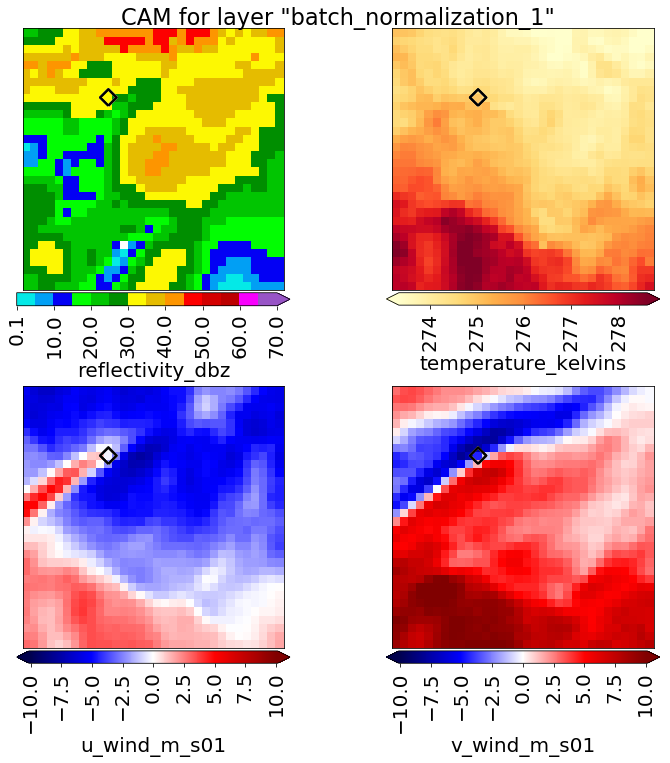

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1173: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


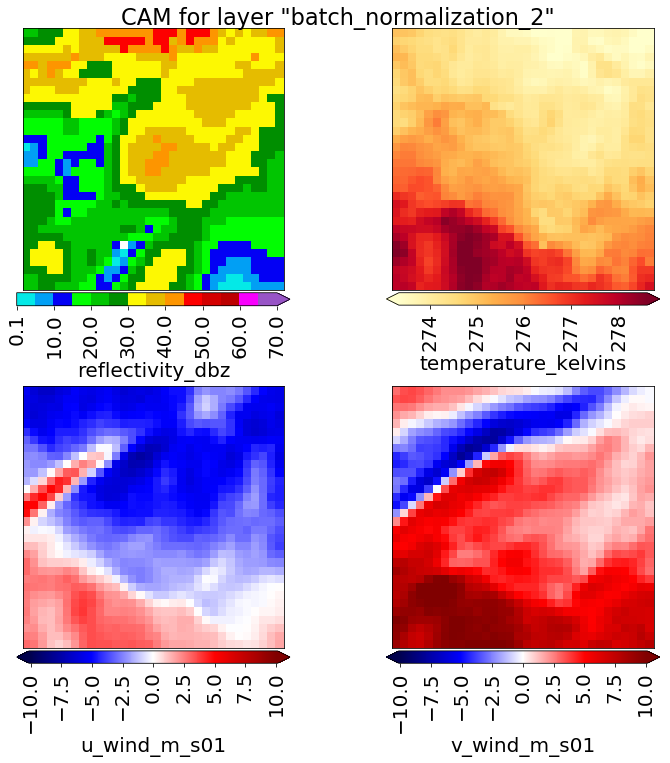

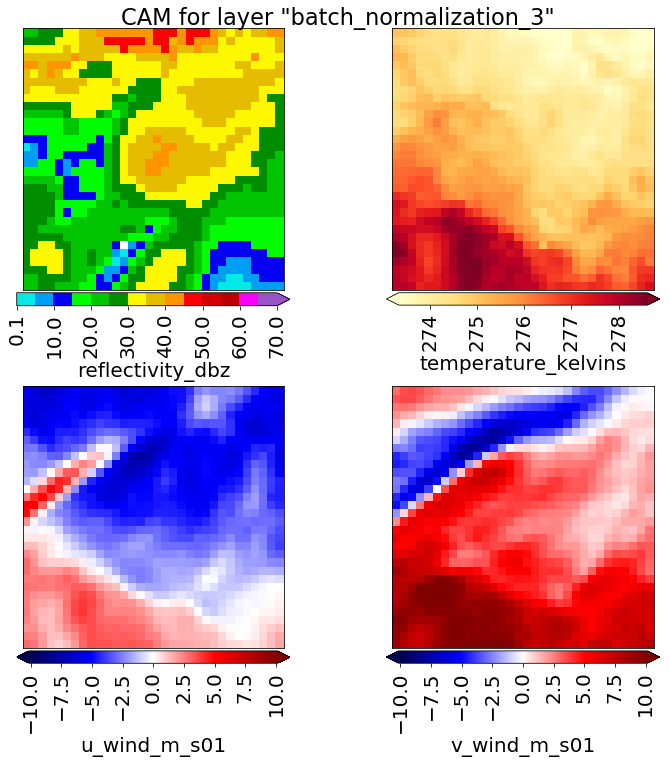

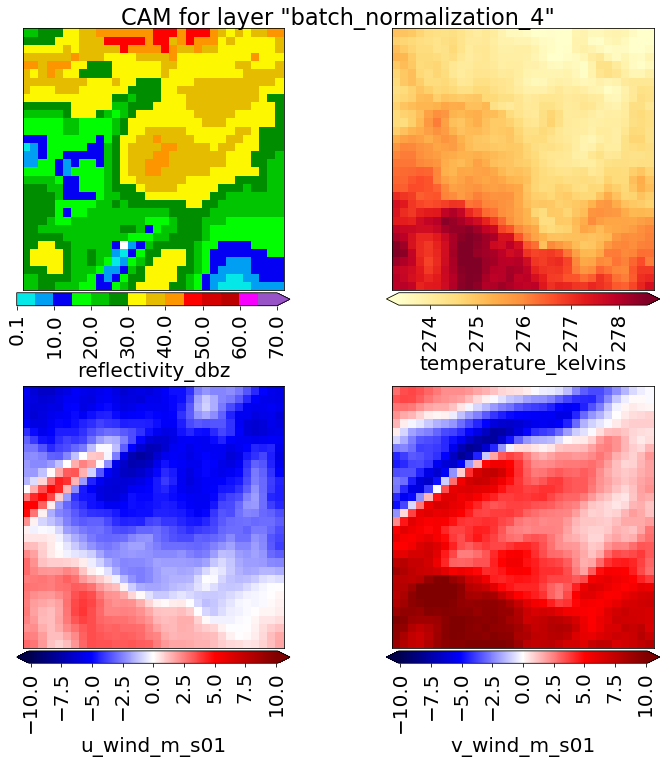

In [17]:
predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

target_layer_names = [
    'batch_normalization_1', 'batch_normalization_2',
    'batch_normalization_3', 'batch_normalization_4'
]

for this_layer_name in target_layer_names:
    class_activation_matrix = class_activation.run_gradcam(
        model_object=cnn_model_object, input_matrix=predictor_matrix_norm,
        target_class=1, target_layer_name=this_layer_name
    )

    figure_object, axes_object_matrix = (
        plotting.plot_many_predictors_sans_barbs(
            predictor_matrix=predictor_matrix_denorm,
            predictor_names=predictor_names,
            min_colour_temp_kelvins=min_temp_kelvins,
            max_colour_temp_kelvins=max_temp_kelvins,
            max_colour_wind_speed_m_s01=max_speed_m_s01)
    )

    max_contour_value = numpy.percentile(class_activation_matrix, 99)

    class_activation.plot_2d_cam(
        class_activation_matrix_2d=class_activation_matrix,
        axes_object_matrix=axes_object_matrix,
        num_channels=predictor_matrix_norm.shape[-1],
        colour_map_object=pyplot.get_cmap('Greys'),
        min_contour_value=max_contour_value / 15,
        max_contour_value=max_contour_value,
        contour_interval=max_contour_value / 15
    )

    figure_object.suptitle(
        'CAM for layer "{0:s}"'.format(this_layer_name)
    )
    pyplot.show()

# Class Activation: Example 2

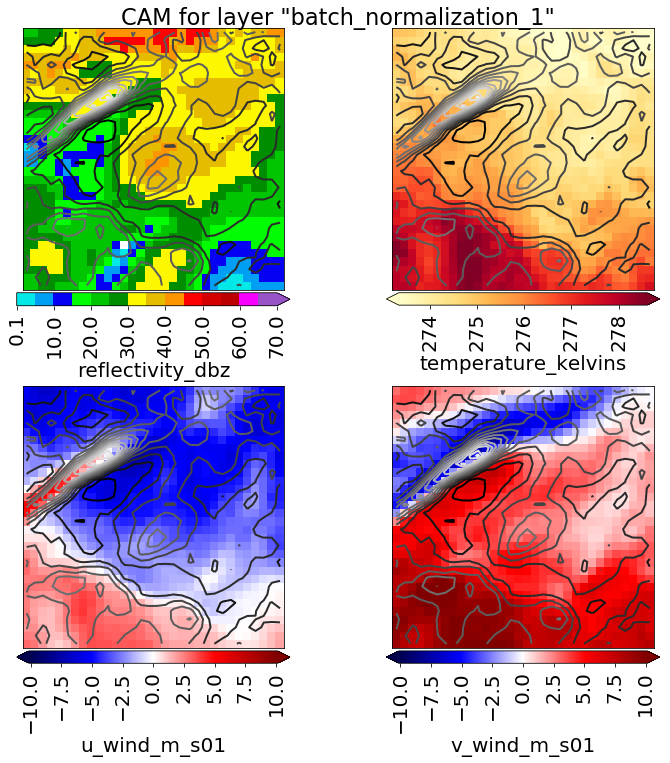

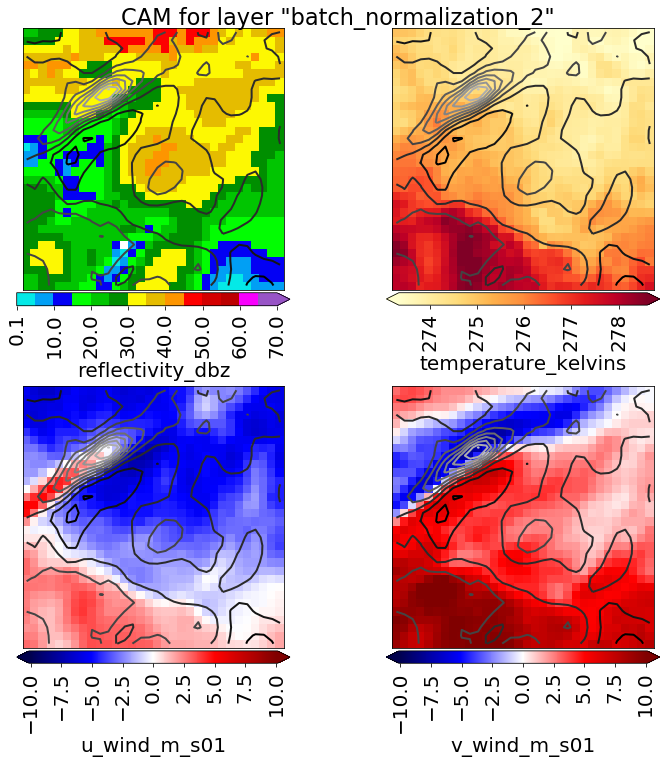

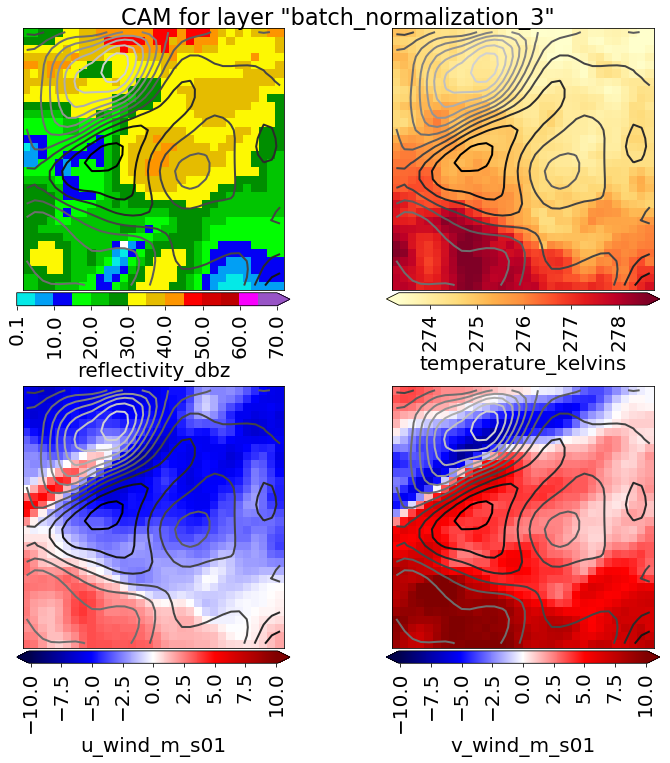

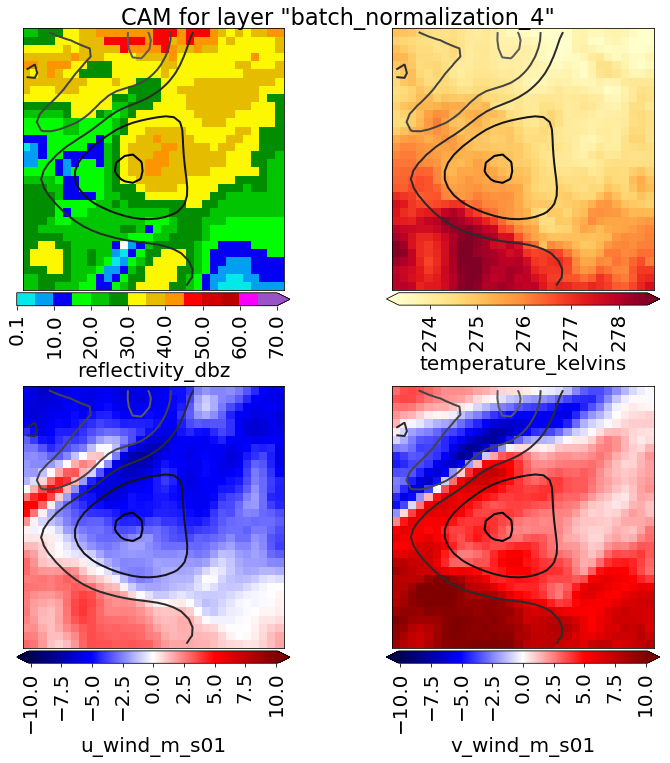

In [22]:
predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

target_layer_names = [
    'batch_normalization_1', 'batch_normalization_2',
    'batch_normalization_3', 'batch_normalization_4'
]

for this_layer_name in target_layer_names:
    class_activation_matrix = class_activation.run_gradcam(
        model_object=cnn_model_object, input_matrix=predictor_matrix_norm,
        target_class=0, target_layer_name=this_layer_name
    )

    figure_object, axes_object_matrix = (
        plotting.plot_many_predictors_sans_barbs(
            predictor_matrix=predictor_matrix_denorm,
            predictor_names=predictor_names,
            min_colour_temp_kelvins=min_temp_kelvins,
            max_colour_temp_kelvins=max_temp_kelvins,
            max_colour_wind_speed_m_s01=max_speed_m_s01)
    )

    max_contour_value = numpy.percentile(class_activation_matrix, 99)

    class_activation.plot_2d_cam(
        class_activation_matrix_2d=class_activation_matrix,
        axes_object_matrix=axes_object_matrix,
        num_channels=predictor_matrix_norm.shape[-1],
        colour_map_object=pyplot.get_cmap('Greys'),
        min_contour_value=max_contour_value / 15,
        max_contour_value=max_contour_value,
        contour_interval=max_contour_value / 15
    )

    figure_object.suptitle(
        'CAM for layer "{0:s}"'.format(this_layer_name)
    )
    pyplot.show()

# Class Activation: Example 3

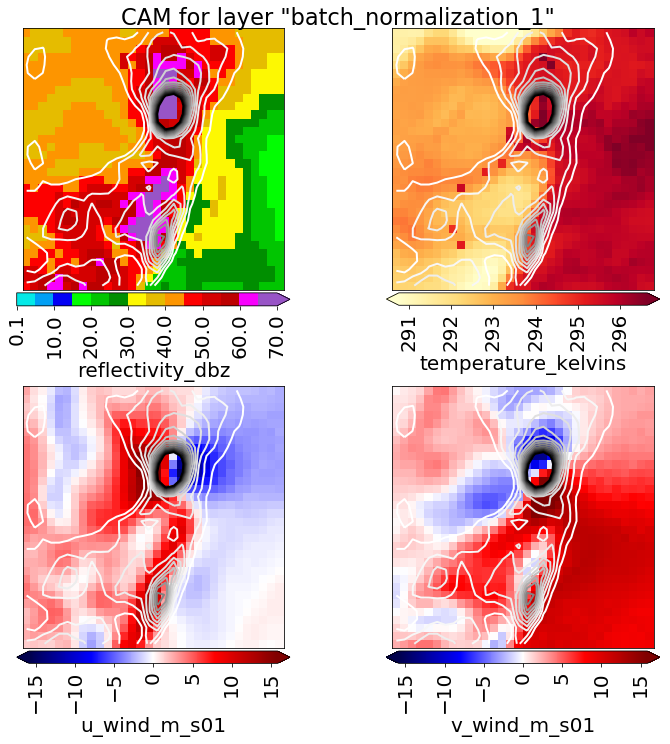

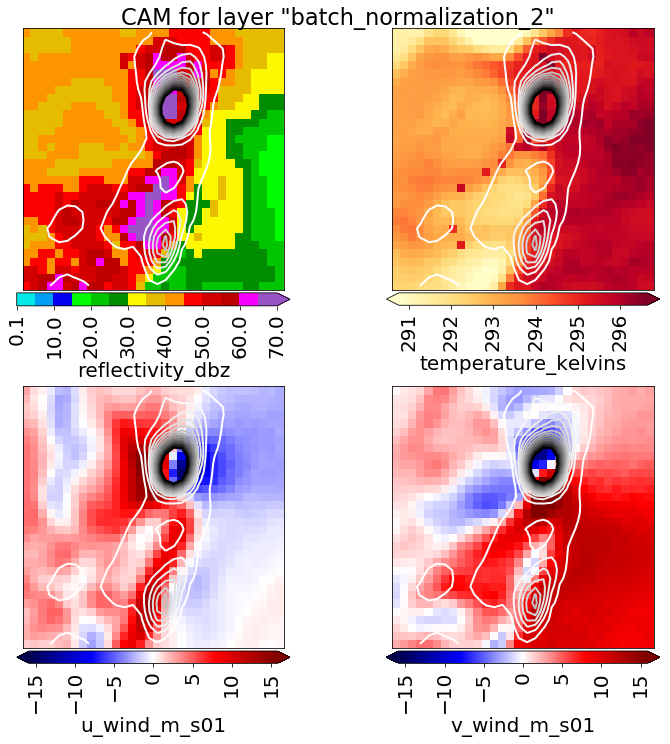

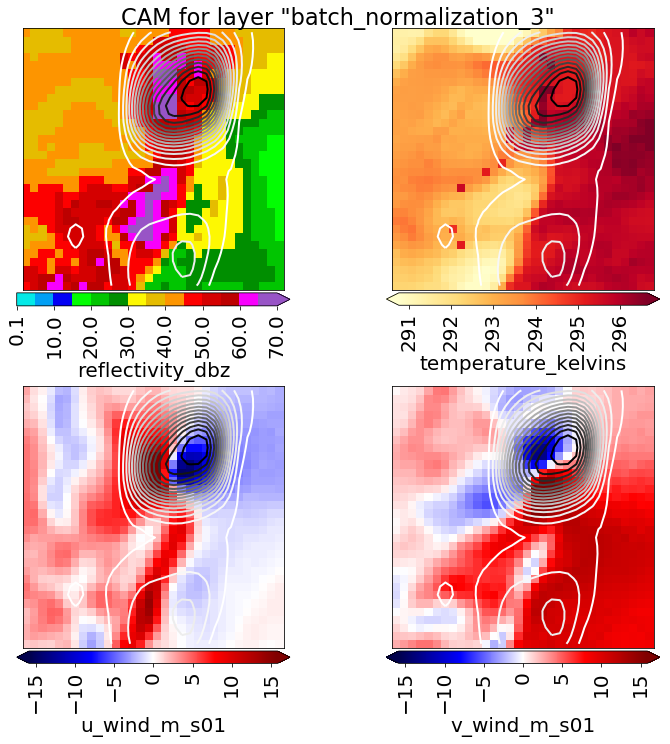

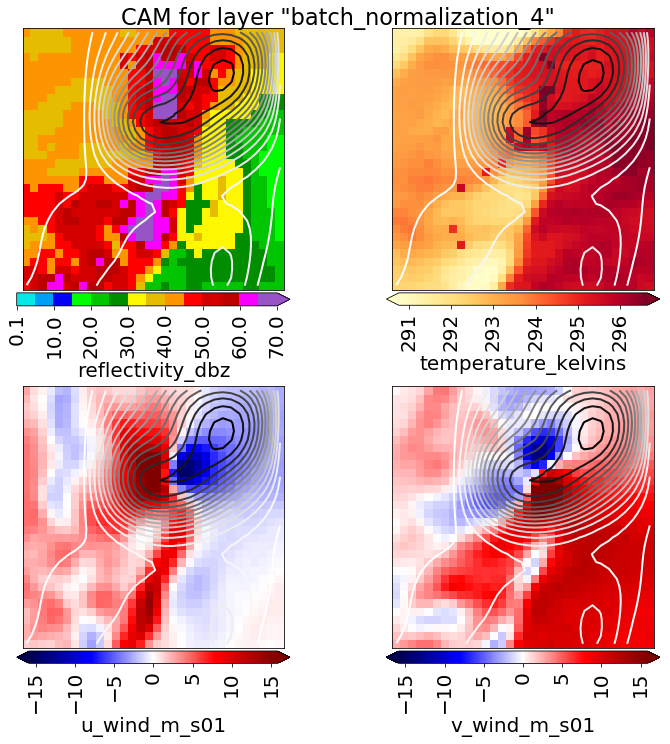

In [23]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

target_layer_names = [
    'batch_normalization_1', 'batch_normalization_2',
    'batch_normalization_3', 'batch_normalization_4'
]

for this_layer_name in target_layer_names:
    class_activation_matrix = class_activation.run_gradcam(
        model_object=cnn_model_object, input_matrix=predictor_matrix_norm,
        target_class=1, target_layer_name=this_layer_name
    )

    figure_object, axes_object_matrix = (
        plotting.plot_many_predictors_sans_barbs(
            predictor_matrix=predictor_matrix_denorm,
            predictor_names=predictor_names,
            min_colour_temp_kelvins=min_temp_kelvins,
            max_colour_temp_kelvins=max_temp_kelvins,
            max_colour_wind_speed_m_s01=max_speed_m_s01)
    )

    max_contour_value = numpy.percentile(class_activation_matrix, 99)

    class_activation.plot_2d_cam(
        class_activation_matrix_2d=class_activation_matrix,
        axes_object_matrix=axes_object_matrix,
        num_channels=predictor_matrix_norm.shape[-1],
        colour_map_object=pyplot.get_cmap('Greys'),
        min_contour_value=max_contour_value / 15,
        max_contour_value=max_contour_value,
        contour_interval=max_contour_value / 15
    )

    figure_object.suptitle(
        'CAM for layer "{0:s}"'.format(this_layer_name)
    )
    pyplot.show()

# Class Activation: Example 4

Have computed CAM for 0 of 40 extreme examples...
Have computed CAM for 4 of 40 extreme examples...
Have computed CAM for 8 of 40 extreme examples...
Have computed CAM for 12 of 40 extreme examples...
Have computed CAM for 16 of 40 extreme examples...
Have computed CAM for 20 of 40 extreme examples...
Have computed CAM for 24 of 40 extreme examples...
Have computed CAM for 28 of 40 extreme examples...
Have computed CAM for 32 of 40 extreme examples...
Have computed CAM for 36 of 40 extreme examples...
Have computed CAM for all 40 extreme examples!


/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1173: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


Text(0.5,0.98,'Class activation for best correct nulls')

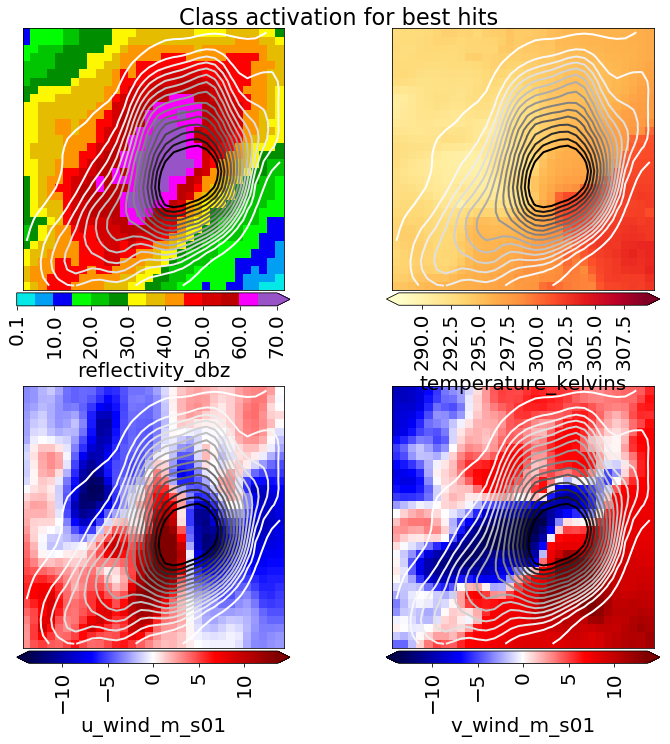

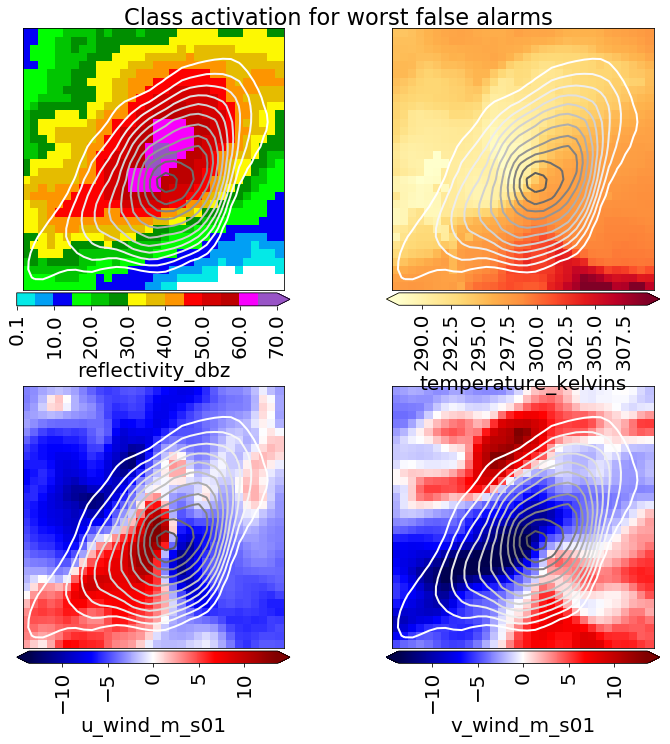

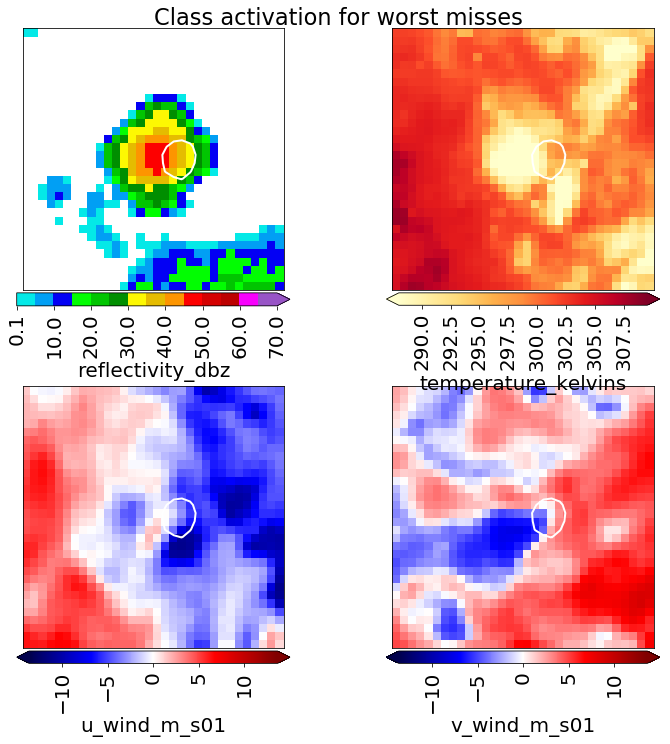

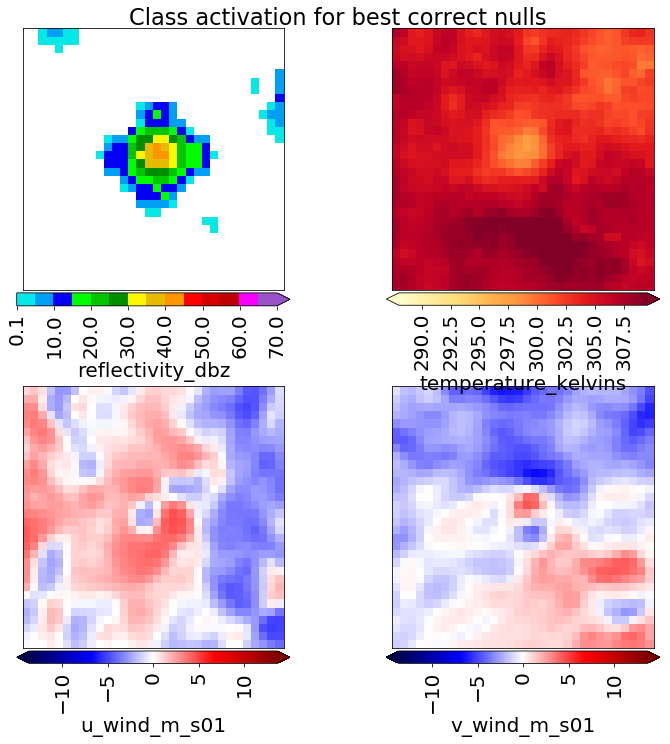

In [23]:
# num_examples_per_set = (
#     extreme_example_dict_norm[BEST_HIT_MATRIX_KEY].shape[0]
# )
num_examples_per_set = 10

best_hits_matrix_denorm = extreme_example_dict_denorm[
    BEST_HIT_MATRIX_KEY
][:num_examples_per_set, ...]

worst_fa_matrix_denorm = extreme_example_dict_denorm[
    WORST_FALSE_ALARM_MATRIX_KEY
][:num_examples_per_set, ...]

worst_misses_matrix_denorm = extreme_example_dict_denorm[
    WORST_MISS_MATRIX_KEY
][:num_examples_per_set, ...]

best_nulls_matrix_denorm = extreme_example_dict_denorm[
    BEST_CORRECT_NULLS_MATRIX_KEY
][:num_examples_per_set, ...]

best_hits_matrix_denorm_pmm = utils.run_pmm_many_variables(
    field_matrix=best_hits_matrix_denorm
)
worst_fa_matrix_denorm_pmm = utils.run_pmm_many_variables(
    field_matrix=worst_fa_matrix_denorm
)
worst_misses_matrix_denorm_pmm = utils.run_pmm_many_variables(
    field_matrix=worst_misses_matrix_denorm
)
best_nulls_matrix_denorm_pmm = utils.run_pmm_many_variables(
    field_matrix=best_nulls_matrix_denorm
)

these_dim = best_hits_matrix_denorm.shape[:-1]
best_hits_activn_matrix = numpy.full(these_dim, numpy.nan)
worst_fa_activn_matrix = numpy.full(these_dim, numpy.nan)
worst_misses_activn_matrix = numpy.full(these_dim, numpy.nan)
best_nulls_activn_matrix = numpy.full(these_dim, numpy.nan)

for i in range(num_examples_per_set):
    print('Have computed CAM for {0:d} of {1:d} extreme examples...'.format(
        4 * i, 4 * num_examples_per_set
    ))

    best_hits_activn_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=extreme_example_dict_norm[BEST_HIT_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name='batch_normalization_3'
    )

    worst_fa_activn_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=
        extreme_example_dict_norm[WORST_FALSE_ALARM_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name='batch_normalization_3'
    )

    worst_misses_activn_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=
        extreme_example_dict_norm[WORST_MISS_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name='batch_normalization_3'
    )

    best_nulls_activn_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=
        extreme_example_dict_norm[BEST_CORRECT_NULLS_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name='batch_normalization_3'
    )

print('Have computed CAM for all {0:d} extreme examples!'.format(
    4 * num_examples_per_set
))

best_hits_activn_matrix_pmm = utils.run_pmm_one_variable(
    field_matrix=best_hits_activn_matrix
)
worst_fa_activn_matrix_pmm = utils.run_pmm_one_variable(
    field_matrix=worst_fa_activn_matrix
)
worst_misses_activn_matrix_pmm = utils.run_pmm_one_variable(
    field_matrix=worst_misses_activn_matrix
)
best_nulls_activn_matrix_pmm = utils.run_pmm_one_variable(
    field_matrix=best_nulls_activn_matrix
)

concat_predictor_matrix = numpy.stack((
    best_hits_matrix_denorm_pmm, worst_fa_matrix_denorm_pmm,
    worst_misses_matrix_denorm_pmm, best_nulls_matrix_denorm_pmm,
), axis=0)

predictor_names = extreme_example_dict_denorm[PREDICTOR_NAMES_KEY]

temperature_matrix_kelvins = concat_predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(concat_predictor_matrix[..., wind_indices]), 99
)

concat_activation_matrix = numpy.stack((
    best_hits_activn_matrix_pmm, worst_fa_activn_matrix_pmm,
    worst_misses_activn_matrix_pmm, best_nulls_activn_matrix_pmm,
), axis=0)

max_contour_value = numpy.percentile(concat_activation_matrix, 99)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=best_hits_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=best_hits_activn_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=max_contour_value / 15,
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 15
)

figure_object.suptitle('Class activation for best hits')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=worst_fa_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=worst_fa_activn_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=max_contour_value / 15,
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 15
)

figure_object.suptitle('Class activation for worst false alarms')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=worst_misses_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=worst_misses_activn_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=max_contour_value / 15,
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 15
)

figure_object.suptitle('Class activation for worst misses')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=best_nulls_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=best_nulls_activn_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=max_contour_value / 15,
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 15
)

figure_object.suptitle('Class activation for best correct nulls')

# Backwards Optimization: Example 1

Loss after 0 of 1000 iterations = 9.86e-01 ... activation = 7.04e-03
Loss after 100 of 1000 iterations = 9.86e-01 ... activation = 7.36e-03
Loss after 200 of 1000 iterations = 9.85e-01 ... activation = 7.86e-03
Loss after 300 of 1000 iterations = 9.84e-01 ... activation = 8.69e-03
Loss after 400 of 1000 iterations = 9.83e-01 ... activation = 1.01e-02
Loss after 500 of 1000 iterations = 9.80e-01 ... activation = 1.23e-02
Loss after 600 of 1000 iterations = 9.75e-01 ... activation = 1.61e-02
Loss after 700 of 1000 iterations = 9.66e-01 ... activation = 2.18e-02
Loss after 800 of 1000 iterations = 9.49e-01 ... activation = 3.18e-02
Loss after 900 of 1000 iterations = 9.20e-01 ... activation = 4.87e-02
Loss after 1000 iterations = 8.73e-01 ... activation = 7.57e-02


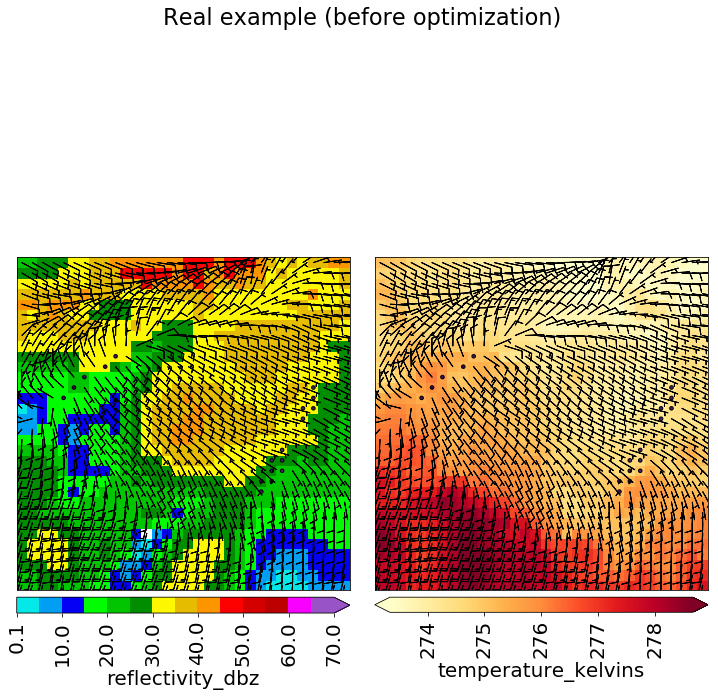

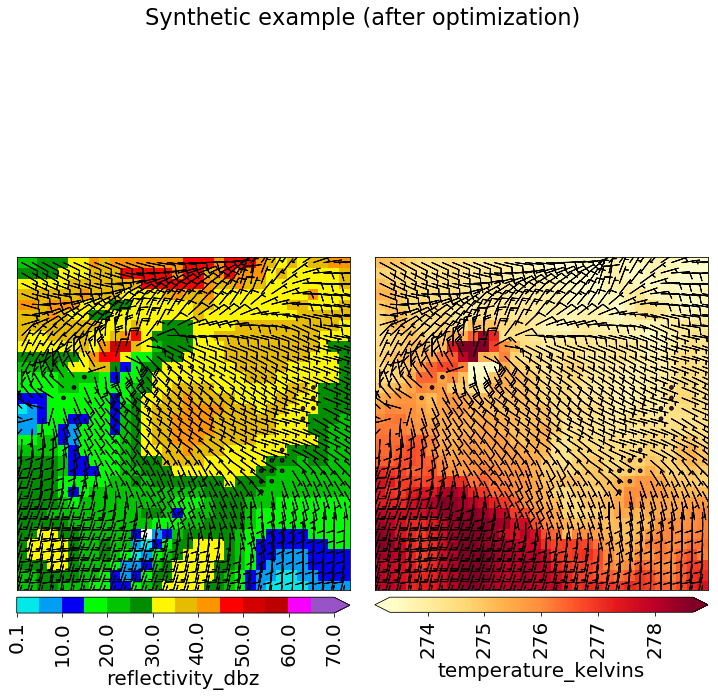

In [23]:
orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

new_predictor_matrix_norm = backwards_opt.optimize_example_for_class(
    model_object=cnn_model_object, input_matrix=orig_predictor_matrix_norm,
    target_class=1, num_iterations=1000, learning_rate=0.0001,
    l2_weight=0.0005
)[0][0, ...]

new_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=new_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
combined_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    new_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 99)

figure_object, _ = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

figure_object.suptitle('Real example (before optimization)')
pyplot.show()

figure_object, _ = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=new_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

figure_object.suptitle('Synthetic example (after optimization)')
pyplot.show()

# Backwards Optimization: Example 2

Loss after 0 of 1000 iterations = 4.96e-05 ... activation = 7.04e-03
Loss after 100 of 1000 iterations = 4.69e-05 ... activation = 6.85e-03
Loss after 200 of 1000 iterations = 4.51e-05 ... activation = 6.72e-03
Loss after 300 of 1000 iterations = 4.38e-05 ... activation = 6.62e-03
Loss after 400 of 1000 iterations = 4.27e-05 ... activation = 6.53e-03
Loss after 500 of 1000 iterations = 4.18e-05 ... activation = 6.47e-03
Loss after 600 of 1000 iterations = 4.11e-05 ... activation = 6.41e-03
Loss after 700 of 1000 iterations = 4.04e-05 ... activation = 6.36e-03
Loss after 800 of 1000 iterations = 3.99e-05 ... activation = 6.31e-03
Loss after 900 of 1000 iterations = 3.93e-05 ... activation = 6.27e-03
Loss after 1000 iterations = 3.88e-05 ... activation = 6.23e-03


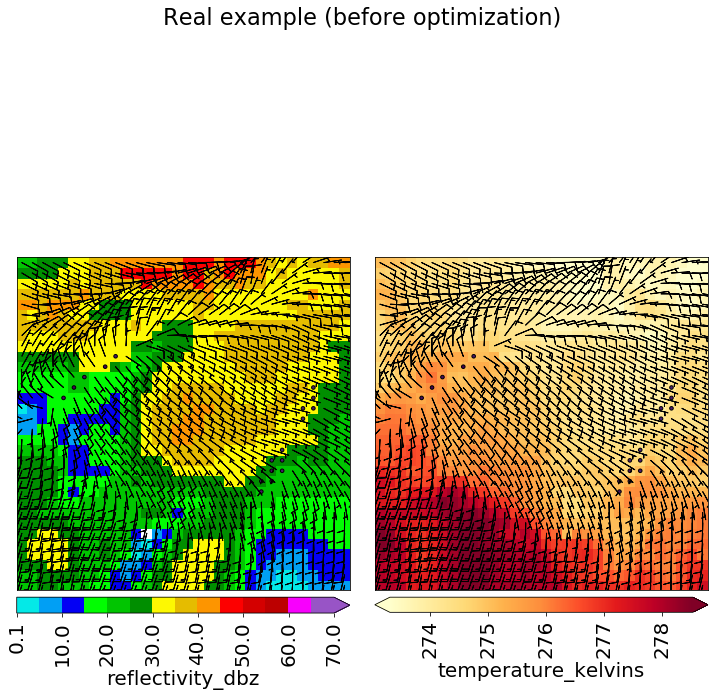

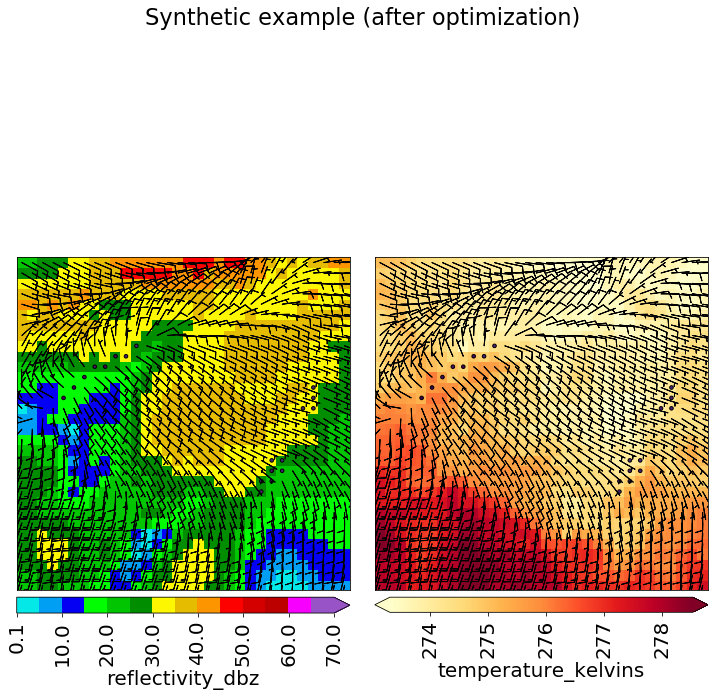

In [26]:
orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

new_predictor_matrix_norm = backwards_opt.optimize_example_for_class(
    model_object=cnn_model_object, input_matrix=orig_predictor_matrix_norm,
    target_class=0, num_iterations=1000, learning_rate=0.0001,
    l2_weight=0.
)[0][0, ...]

new_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=new_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
combined_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    new_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 99)

figure_object, _ = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

figure_object.suptitle('Real example (before optimization)')
pyplot.show()

figure_object, _ = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=new_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

figure_object.suptitle('Synthetic example (after optimization)')
pyplot.show()

# Backwards Optimization: Example 3

Loss after 0 of 1000 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 100 of 1000 iterations = 9.91e-01 ... activation = 9.95e-01
Loss after 200 of 1000 iterations = 4.55e-01 ... activation = 6.75e-01
Loss after 300 of 1000 iterations = 4.26e-02 ... activation = 2.06e-01
Loss after 400 of 1000 iterations = 1.85e-02 ... activation = 1.36e-01
Loss after 500 of 1000 iterations = 3.97e-03 ... activation = 6.30e-02
Loss after 600 of 1000 iterations = 5.42e-04 ... activation = 2.33e-02
Loss after 700 of 1000 iterations = 2.09e-04 ... activation = 1.45e-02
Loss after 800 of 1000 iterations = 1.34e-04 ... activation = 1.16e-02
Loss after 900 of 1000 iterations = 9.86e-05 ... activation = 9.93e-03
Loss after 1000 iterations = 6.52e-05 ... activation = 8.07e-03


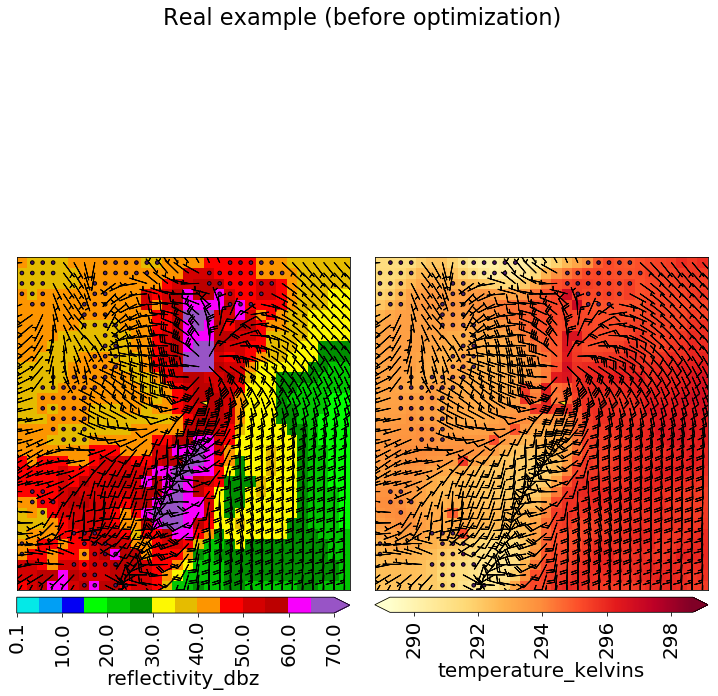

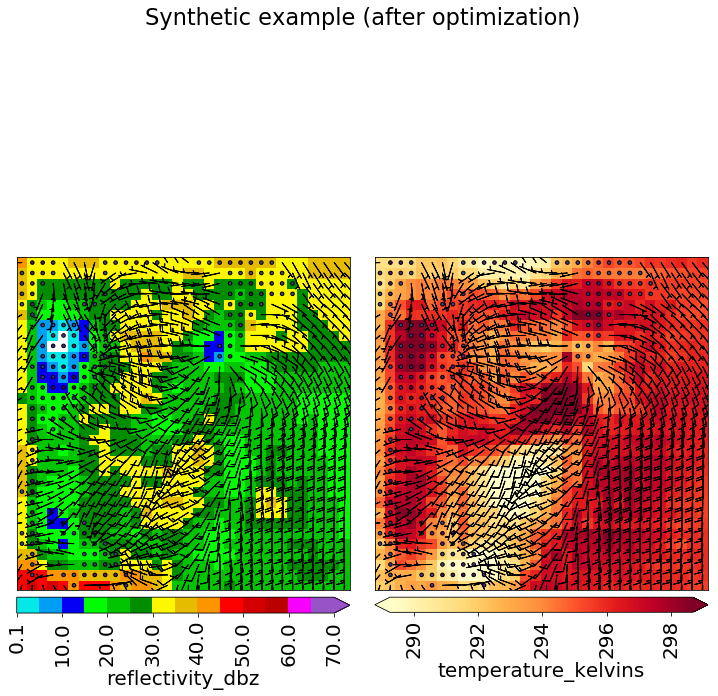

In [35]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

new_predictor_matrix_norm = backwards_opt.optimize_example_for_class(
    model_object=cnn_model_object, input_matrix=orig_predictor_matrix_norm,
    target_class=0, num_iterations=1000, learning_rate=0.001,
    l2_weight=0.
)[0][0, ...]

new_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=new_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
combined_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    new_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 99)

figure_object, _ = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

figure_object.suptitle('Real example (before optimization)')
pyplot.show()

figure_object, _ = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=new_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

figure_object.suptitle('Synthetic example (after optimization)')
pyplot.show()

# Backwards Optimization: Example 4

Loss after 0 of 1000 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 100 of 1000 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 200 of 1000 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 300 of 1000 iterations = 9.98e-01 ... activation = 9.99e-01
Loss after 400 of 1000 iterations = 9.92e-01 ... activation = 9.95e-01
Loss after 500 of 1000 iterations = 9.67e-01 ... activation = 9.83e-01
Loss after 600 of 1000 iterations = 8.93e-01 ... activation = 9.44e-01
Loss after 700 of 1000 iterations = 7.22e-01 ... activation = 8.48e-01
Loss after 800 of 1000 iterations = 4.58e-01 ... activation = 6.74e-01
Loss after 900 of 1000 iterations = 2.32e-01 ... activation = 4.77e-01
Loss after 1000 iterations = 1.26e-01 ... activation = 3.47e-01


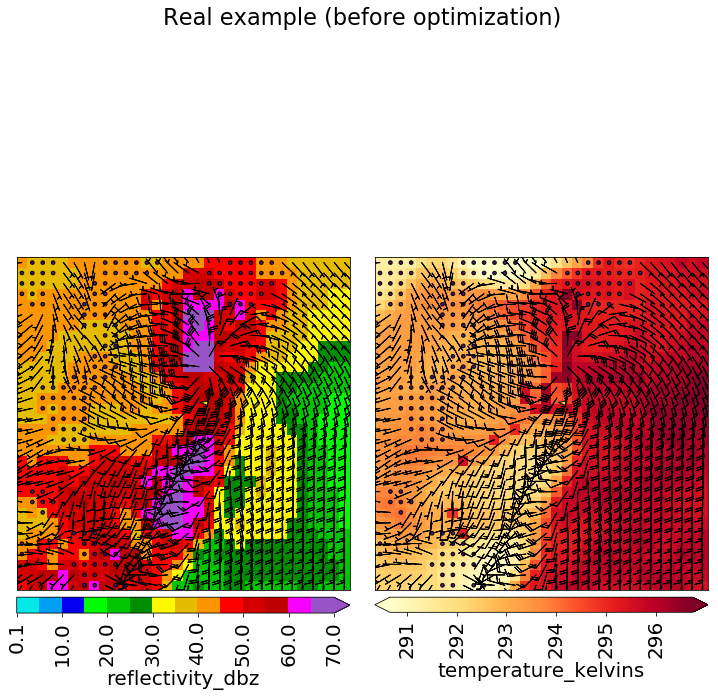

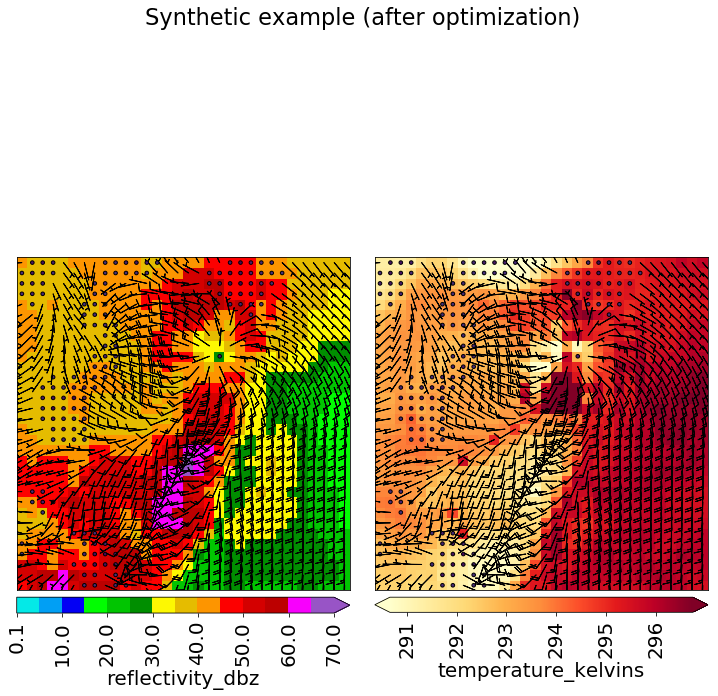

In [43]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

new_predictor_matrix_norm = backwards_opt.optimize_example_for_class(
    model_object=cnn_model_object, input_matrix=orig_predictor_matrix_norm,
    target_class=0, num_iterations=1000, learning_rate=2.5e-4,
    l2_weight=2.5e-5
)[0][0, ...]

new_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=new_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
combined_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    new_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 99)

figure_object, _ = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

figure_object.suptitle('Real example (before optimization)')
pyplot.show()

figure_object, _ = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=new_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

figure_object.suptitle('Synthetic example (after optimization)')
pyplot.show()

# Upconvnets

Upconvnets (upconvolutional networks) are basically the inverse of a CNN (convolutional network).  The goal of a CNN is to minimize the loss function (*e.g.*, cross-entropy) for a prediction task.  During this process, the CNN runs convolutional filters over the input images (*e.g.*, model grids of reflectivity, temperature, $u$-wind, and $v$-wind).  This is achieved by a stack of convolutional layers (shown below), which are followed by a stack of dense layers (or "fully connected" layers &ndash; the kind that occur in a traditional neural net).

<img src="cnn_architecture.jpg" alt="CNN architecture" width="1000" />

Between the convolutional and dense layers, there is a flattening layer, which collapses feature maps learned by the convolutional filters into a 1-D vector.  The numbers in this vector are called "scalar features," because they are no longer in a spatial grid.

The goal of an upconvnet is to transform these scalar features back into the original images (*e.g.*, model grids of reflectivity, temperature, $u$-wind, and $v$-wind).

We will use upconvnets for the next interpretation method (novelty detection).

# Upconvnet Setup: Example

The next cell runs `setup_ucn`, which prints the architecture in a plain-text table.  The architecture is explained below.

 - The input is a length-6400 vector (preferably created by the flattening layer of the CNN).
 - The "reshaping" layer changes the dimensions to $5 \times 5 \times 256$.
 - The first transposed convolution (or "deconvolution" or "upconvolution") changes the dimensions to $10 \times 10 \times 256$ (10 rows, 10 columns, and 256 filters).
 - The next transposed convolution changes the dimensions to $12 \times 12 \times 128$.  In general, as data are passed through the upconvnet, the spatial dimensions grow and the number of filters shrinks &ndash; the opposite of what happens in a CNN.
 - The next transposed convolution changes the dimensions to $14 \times 14 \times 64$.
 - The next transposed convolution changes the dimensions to $28 \times 28 \times 64$.
 - The next transposed convolution changes the dimensions to $30 \times 30 \times 32$.
 - The final transposed convolution changes the dimensions to $32 \times 32 \times 4$ (same as the original model grids).
 
The loss function is pixelwise mean squared error, defined below.

$\textrm{MSE} = \frac{1}{N} \frac{1}{32} \frac{1}{32} \frac{1}{4} (\hat{y}_{i, j, k, m} - y_{i, j, k, m})^2$

$N$ is the number of examples in the batch; $y_{i, j, k, m}$ is the actual value (in the original image) of the $m^{\textrm{th}}$ predictors in the $j^{\textrm{th}}$ row and $k^{\textrm{th}}$ column of the $i^{\textrm{th}}$ example; and $\hat{y}_{i, j, k, m}$ is the corresponding predicted value (in the reconstructed image).

For each **batch** of training examples, MSE is computed and all weights in the upconvnet &ndash; most of which reside in the transposed-convolution layers &ndash; are adjusted slightly in a way that reduces MSE.

# Applying the Upconvnet: Example 1

The next cell reads the pre-trained upconvnet and uses it to reconstruct a random validation example.

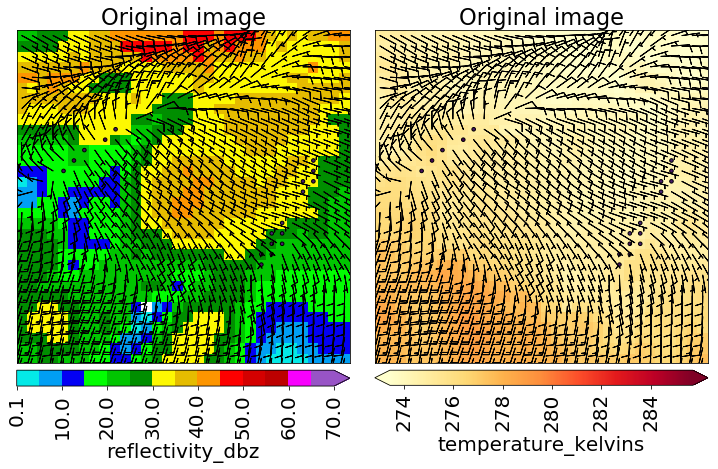

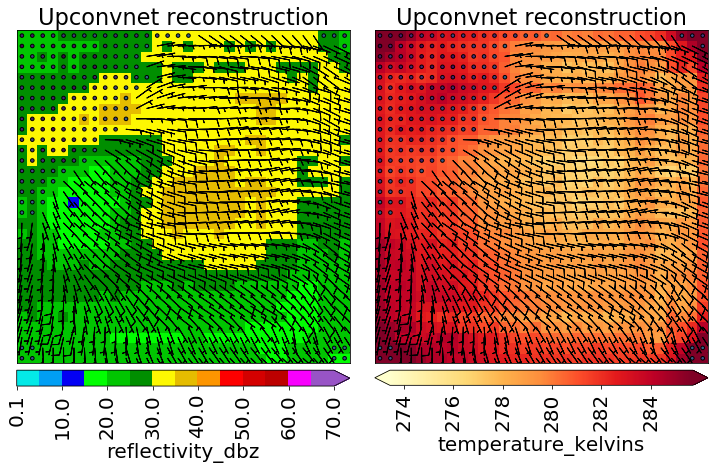

In [16]:
orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

recon_predictor_matrix_norm = cnn.apply_upconvnet(
    cnn_model_object=cnn_model_object,
    predictor_matrix=orig_predictor_matrix_norm,
    cnn_feature_layer_name=cnn.get_flattening_layer(cnn_model_object),
    upconvnet_model_object=upconvnet_model_object,
    verbose=False
)

recon_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=recon_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)[0, ...]

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
concat_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    recon_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(concat_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(concat_temp_matrix_kelvins, 99)

_, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Original image')

_, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=recon_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Upconvnet reconstruction')

# Applying the Upconvnet: Example 2

The next cell applies the upconvnet to the most extreme validation example (greatest future vorticity).

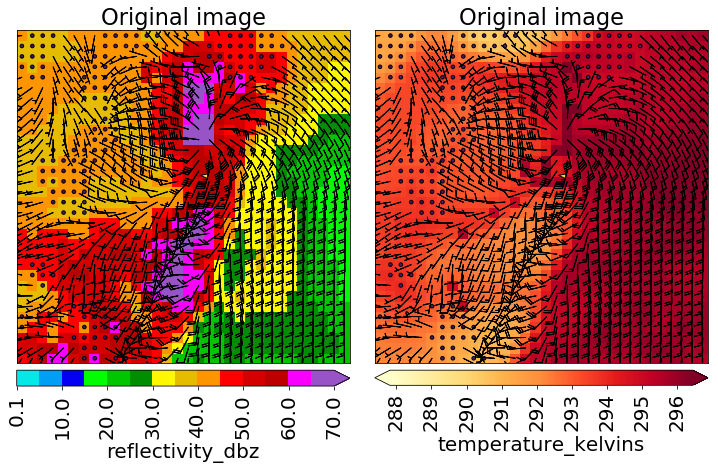

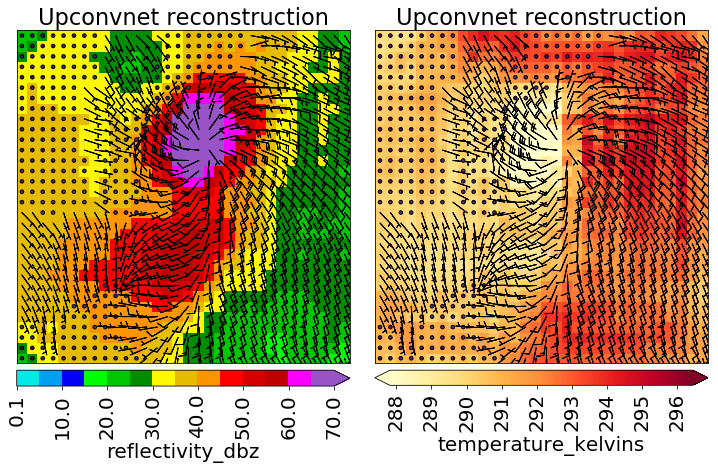

In [22]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

recon_predictor_matrix_norm = cnn.apply_upconvnet(
    cnn_model_object=cnn_model_object,
    predictor_matrix=orig_predictor_matrix_norm,
    cnn_feature_layer_name=cnn.get_flattening_layer(cnn_model_object),
    upconvnet_model_object=upconvnet_model_object,
    verbose=False
)

recon_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=recon_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)[0, ...]

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
concat_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    recon_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(concat_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(concat_temp_matrix_kelvins, 99)

_, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Original image')

_, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=recon_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Upconvnet reconstruction')

# Novelty Detection

The next cell defines methods to perform novelty detection (Wagstaff and Lee 2018).  The purpose of novelty detection is to find the most novel test examples, relative to a set of baseline examples.  As before, each "example" is one set of model grids (reflectivity, temperature, $u$-wind, and $v$-wind), representing one storm cell at one time.

Novelty detection usually fails in image space (the $32 \times 32 \times 4$ matrix), because it fails to capture spatial correlations between nearby grid cells and multivariate correlations at the same grid cell.  Thus, novelty detection is done in **feature space**, which is a condensed representation of the input space.  Our feature space is the length-6400 vector created by the CNN.

But just finding the most novel test example, and leaving it at that, is not very interesting.  We want to know **which parts** of this example make it novel.  This can be done in feature space, but length-6400 vectors are difficult for humans to interpret, especially when we do not have names for the features.  (The features are created autonomously by the CNN, so it's not like we know that, for example, "feature 16 is the maximum radial wind in the left-front quadrant of the storm".)

Thus, after finding the novel parts of the image in feature space, we want to **project** these novel parts into image space (the $32 \times 32 \times 4$ matrix).  This is done by the upconvnet.

The novelty-detection algorithm is outlined below.

 1. Choose the set of baseline examples.
 2. Choose the set of test examples.
 3. Use the CNN to convert both baseline and test examples from images ($32 \times 32 \times 4$) to scalar features (length-6400 vector).
 4. Fit an SVD (singular-value decomposition &ndash some people call this "principal-component analysis") model to the baseline examples in feature space.
 5. Use the SVD model to reconstruct each test example in feature space.  This "reconstruction" is different than the reconstruction performed later by the upconvnet.
 6. Find the test example with the greatest reconstruction error (Euclidean distance between actual and SVD-reconstructed feature vectors).  This is the most novel test example.
 7. For the most novel test example, use the upconvnet to project its feature vector back to image space (call this image $\mathbf{X}_{\textrm{up}}$).  Also use the upconvnet to project the SVD-reconstructed feature vector to image space (call this image $\mathbf{X}_{\textrm{up,svd}}$).  The difference ($\mathbf{X}_{\textrm{up}} - \mathbf{X}_{\textrm{up,svd}}$) is the novel part of the image (relative to the set of baseline examples).
 8. Add the most novel test example to the baseline set.
 9. Repeat steps 4-8 until there are no more test examples (or some other stopping criterion).

# Novelty Detection: Example

The following cell runs novelty detection.  The baseline set consists of 100 random validation examples, and the test set consists of the 100 strongest validation examples (those with the greatest future vorticity).

In [17]:
target_matrix_s_01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
max_target_values_s01 = numpy.max(target_matrix_s_01, axis=(1, 2))

trial_indices = numpy.argsort(-1 * max_target_values_s01)[:100]
trial_indices = trial_indices[trial_indices >= 100]
baseline_indices = numpy.linspace(0, 100, num=100, dtype=int)

baseline_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][baseline_indices, ...]
    + 0.
)
trial_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][trial_indices, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

baseline_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=baseline_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
trial_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=trial_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

novelty_dict = novelty_detection.run_novelty_detection(
    baseline_predictor_matrix_norm=baseline_predictor_matrix_norm,
    trial_predictor_matrix_norm=trial_predictor_matrix_norm,
    cnn_model_object=cnn_model_object,
    cnn_feature_layer_name=cnn.get_flattening_layer(cnn_model_object),
    upconvnet_model_object=upconvnet_model_object,
    num_novel_examples=4, multipass=False
)

novelty_dict[novelty_detection.NOVEL_MATRIX_KEY] = (
    normalization.denormalize_images(
        predictor_matrix=novelty_dict[novelty_detection.NOVEL_MATRIX_KEY],
        predictor_names=predictor_names,
        normalization_dict=normalization_dict
    )
)

novelty_dict[novelty_detection.NOVEL_MATRIX_UPCONV_KEY] = (
    normalization.denormalize_images(
        predictor_matrix=
        novelty_dict[novelty_detection.NOVEL_MATRIX_UPCONV_KEY],
        predictor_names=predictor_names,
        normalization_dict=normalization_dict
    )
)

novelty_dict[novelty_detection.NOVEL_MATRIX_UPCONV_SVD_KEY] = (
    normalization.denormalize_images(
        predictor_matrix=
        novelty_dict[novelty_detection.NOVEL_MATRIX_UPCONV_SVD_KEY],
        predictor_names=predictor_names,
        normalization_dict=normalization_dict
    )
)

Applying model to examples 0-99 of 100...
Have applied model to all 100 examples!


Applying model to examples 0-99 of 100...
Have applied model to all 100 examples!


Finding 1th-most novel trial example...
Number of modes required to explain 97.500000% of variance: 14
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
Finding 2th-most novel trial example...
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
Finding 3th-most novel trial example...
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27

# Novelty Detection: Plotting Example 1

The next cell plots the first-most novel test image, according to novelty detection.

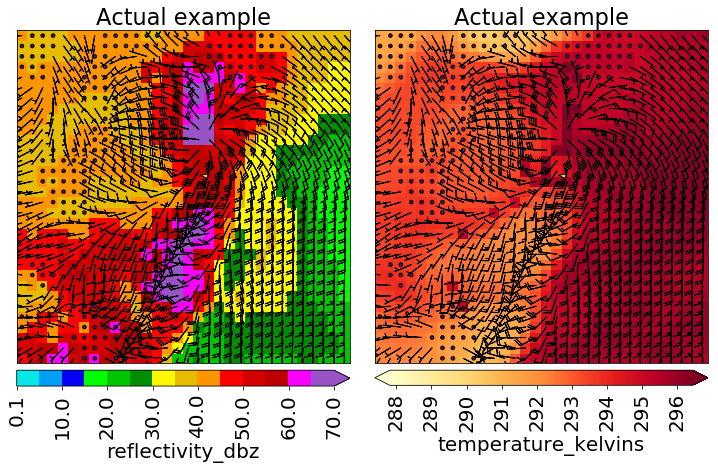

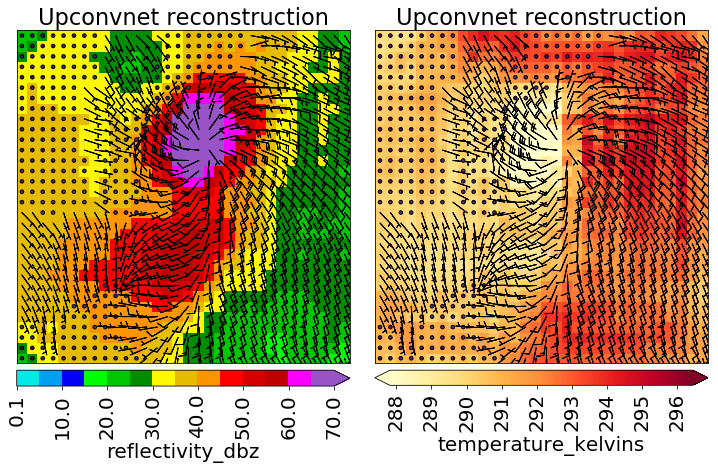

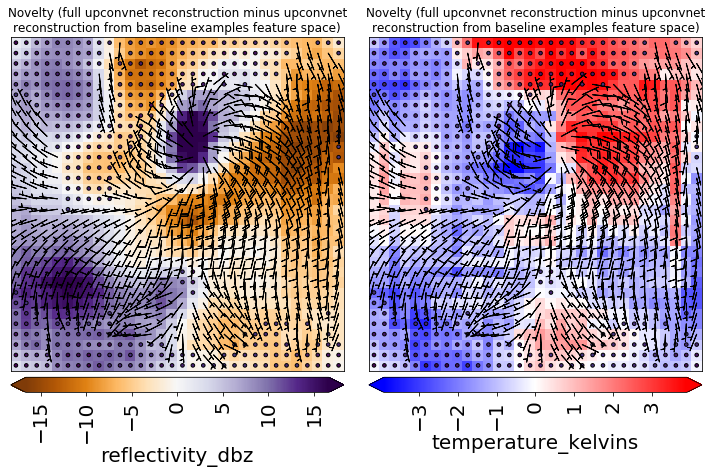

In [18]:
novelty_detection.plot_results(
    novelty_dict_denorm=novelty_dict, plot_index=0,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)

# Novelty Detection: Plotting Example 2

The next cell plots the second-most novel test image.

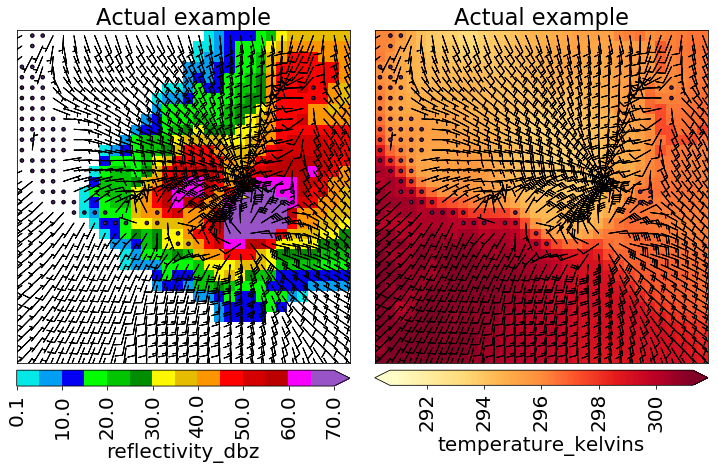

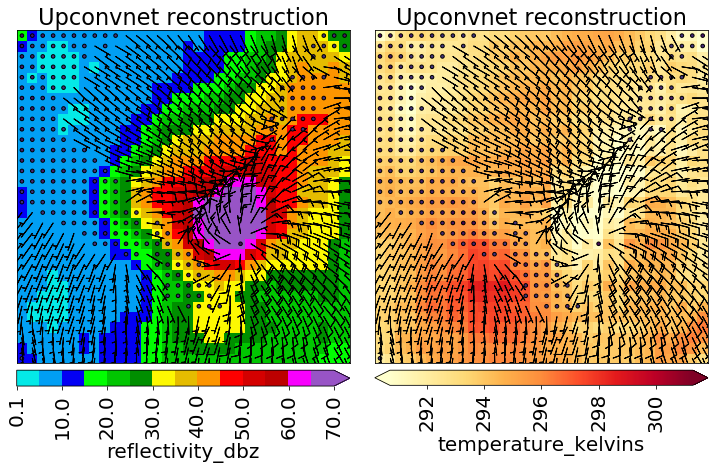

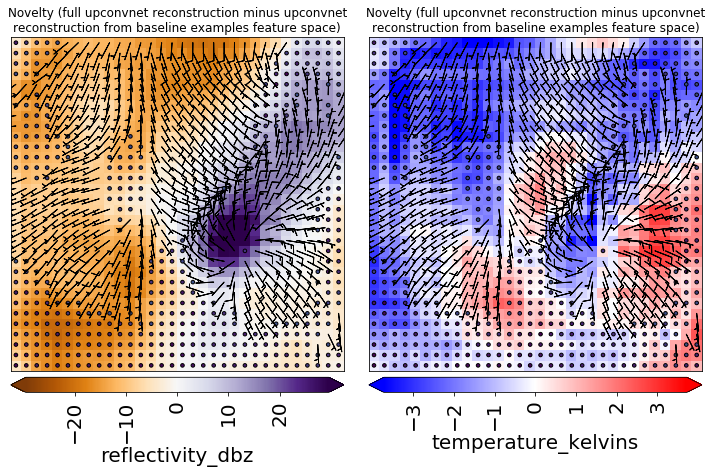

In [19]:
novelty_detection.plot_results(
    novelty_dict_denorm=novelty_dict, plot_index=1,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)

# Novelty Detection: Plotting Example 3

The next cell plots the third-most novel test image.

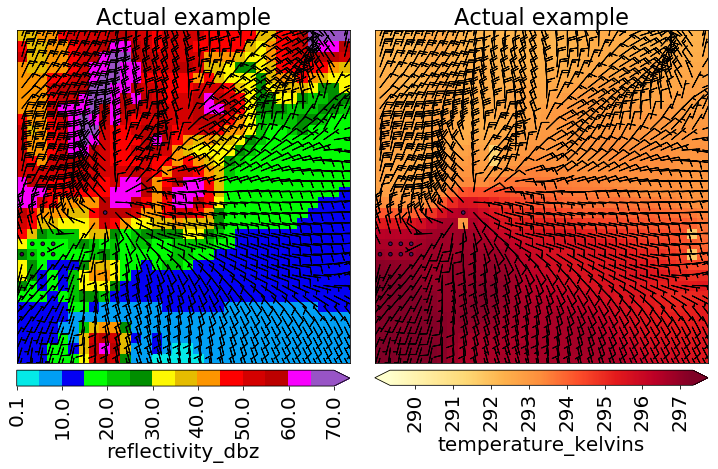

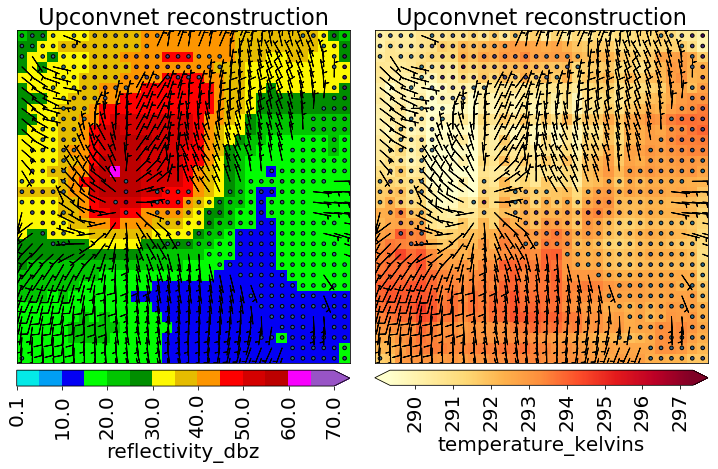

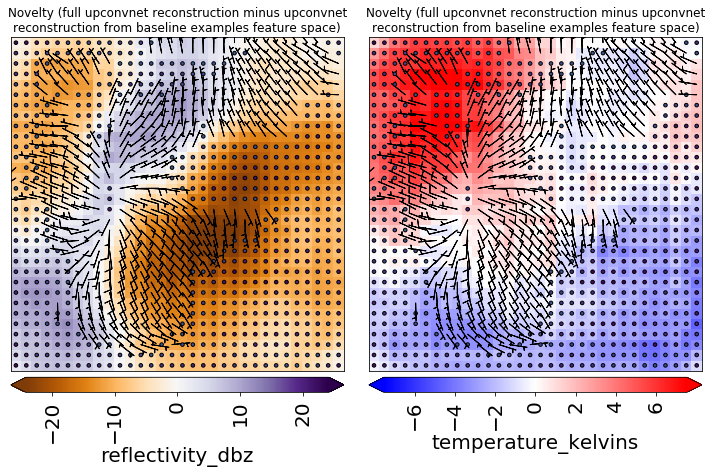

In [20]:
novelty_detection.plot_results(
    novelty_dict_denorm=novelty_dict, plot_index=2,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)

# Novelty Detection: Plotting Example 4

The next cell plots the fourth-most novel test image.

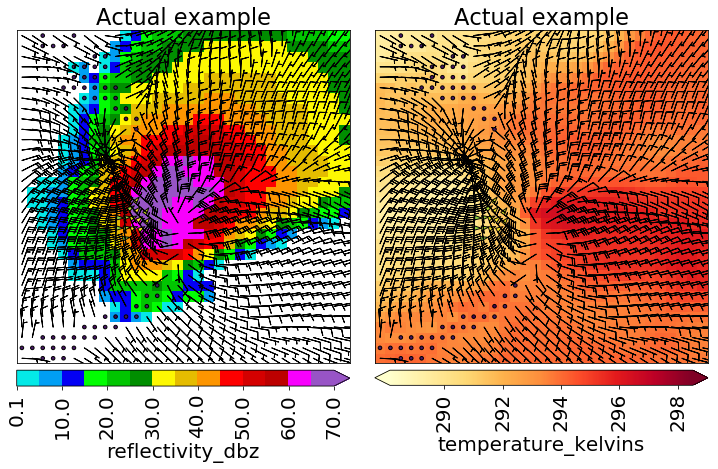

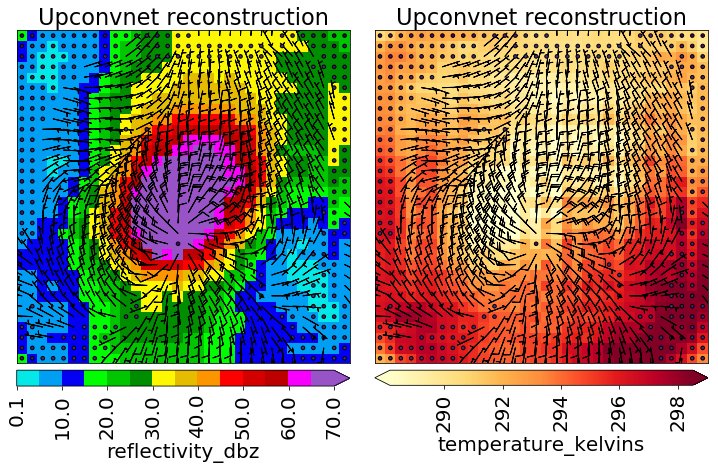

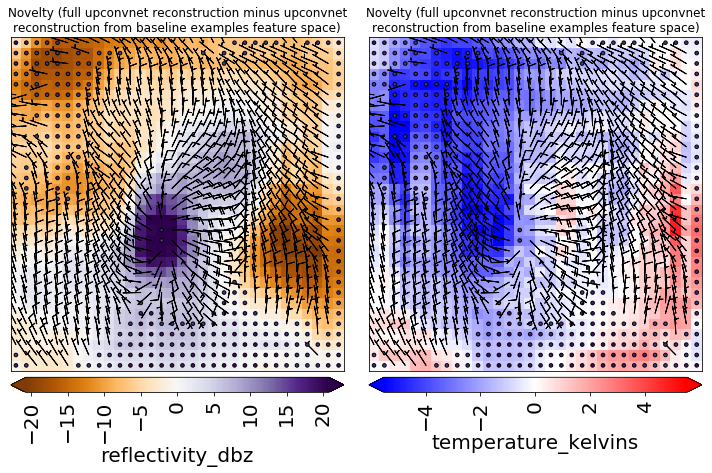

In [21]:
novelty_detection.plot_results(
    novelty_dict_denorm=novelty_dict, plot_index=3,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)